In [1]:
import matplotlib.pyplot as plt
from pylab import rcParams

In [2]:
import numpy as np
import pandas as pd
import os

In [3]:
import mne

In [4]:
import pandas as pd

In [5]:
from scipy.io import loadmat

In [6]:
from sklearn.preprocessing import StandardScaler

In [7]:
from sklearn.decomposition import IncrementalPCA

In [8]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

In [9]:
from sklearn.model_selection import GridSearchCV

In [10]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis as QDA

In [11]:
from sklearn.svm import SVC

In [12]:
from sklearn.ensemble import GradientBoostingClassifier

In [13]:
from sklearn.linear_model import LogisticRegression

In [14]:
import plotly.express as px

In [15]:
from sklearn.decomposition import PCA

In [16]:
from scipy.signal import argrelextrema

In [17]:
from scipy.io import loadmat, savemat

In [18]:
from tqdm import tqdm_notebook

# Convert Data

In [21]:
for i in range(1, 11):
    subject = "s{}".format(i)

    session = loadmat('/tmp/{}.mat'.format(subject))

    channels = session[subject]['train'][0][0][1:9]

    trigger = (session[subject]['train'][0][0][9] > 0).astype(int)
    trigger[(trigger > 0) & (session[subject]['train'][0][0][10] == 0)] -= 2

    converted_session = {
        '__globals__': [],
         '__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Thu Jun 25 11:26:40 2020',
         '__version__': '1.0',
        'fs': np.array([[250]], dtype=np.uint8),
        'trig': trigger[:, np.newaxis],
        'y': channels.T
    }

    savemat('/tmp/{}.mat'.format(subject.upper()), converted_session)

In [22]:
MAIN_CHANNELS = ["Fz", "Cz", "P3", "Pz", "P4", "Po7", "Po8", "Oz"]

In [23]:
sfreq = 250

# Preprocess

In [25]:
def load_data(subject):
    channels = MAIN_CHANNELS
    
    session = loadmat('/tmp/{}.mat'.format(subject))

    session_df = pd.DataFrame(session["y"], columns=channels)

    sfreq = session["fs"][0][0]

    session_df["Time"] = session_df.index / session["fs"][0][0]

    session_df["Trigger"] = session["trig"]
    session_df.loc[session_df["Trigger"] == -1, "Trigger"] = 2
    
    return session_df

In [26]:
def restore_raw(session_df):
    channels = MAIN_CHANNELS + ['Trigger']
    info = mne.create_info(ch_names=channels, sfreq=sfreq)

    raw = mne.io.RawArray(session_df[channels].values.T, info)

    channel_types = {c: 'eeg' for c in channels}
    channel_types['Trigger'] = 'stim'

    raw.set_channel_types(channel_types)
    
    return raw

In [27]:
def filter_signal(raw):
    raw.notch_filter(50)
    raw.filter(0.5, 30)

In [28]:
def plot_raw(raw, start=0, stop=240, scale=100):
    rcParams['figure.figsize'] = 20, 10
    mne.viz.plot_raw(
        raw, 
        start=start, 
        duration=stop - start, 
        show=False, 
        n_channels=8,
        scalings={'eeg': scale}
    )
    plt.show()

In [29]:
def scale_signal(raw, session_df):
    channels = MAIN_CHANNELS + ['Trigger']
    
    channels_data = raw.copy().pick_types(eeg=True).get_data()

    trigger_data = session_df["Trigger"].values

    scaler = StandardScaler()

    scaled_channels_data = scaler.fit_transform(channels_data.T).T

    np.mean(scaled_channels_data, axis=1)

    new_channels_data = np.vstack([
        scaled_channels_data,
        trigger_data[np.newaxis, :]
    ])

    raw = mne.io.RawArray(new_channels_data, raw.info)
    
    channel_types = {c: 'eeg' for c in channels}
    channel_types['Trigger'] = 'stim'

    raw.set_channel_types(channel_types)
    
    return raw

In [41]:
def remove_artifacts(raw, n_components=2):
    print("Removing artifacts with {}".format(n_components))
    ica = mne.preprocessing.ICA()

    ica.fit(raw)

    ica_eeg = ica.get_sources(raw)

    plt.figure(figsize=(10, 5))
    plt.plot(ica_eeg[:, :][0].T + 10 * np.arange(0, 8))

    stds = np.std(np.abs(ica_eeg[:, :][0]), axis=1)
    exclude_components = (-stds).argsort()[0:n_components + 1]

    raw = ica.apply(raw.copy(), exclude=list(exclude_components))
    
    return raw

In [42]:
def get_epochs(raw):
    events = mne.find_events(raw, 'Trigger')
    
    epochs = mne.Epochs(
        raw.pick_types(eeg=True), 
        events, tmin=-0.1, tmax=0.7,
#         reject_by_annotation=False,
        preload=True
    )
#     epochs = epochs.apply_baseline((-0.1, 0))
    return epochs

In [43]:
def show_p300_plots(epochs):
    epochs['1'].average().plot()
    plt.show()
    
    epochs['2'].average().plot()
    plt.show()

In [44]:
def get_erp_scores(epochs, channel):
    scores = epochs.average().data[channel]
    return scores

In [45]:
def detect_peak(scores, start_time=200, end_time=450, draw_peak=False, order=10):
    max_indices,  = argrelextrema(scores, np.greater, order=order)
    
    start_index = (start_time + 100) * sfreq / 1000
    end_index = (end_time + 100) * sfreq / 1000
    max_indices_restricted = max_indices[(max_indices >= start_index) & (max_indices < end_index)]
    
    if draw_peak:
        time = np.linspace(-100, 800, 201)
        plt.figure(figsize=(10, 5))
        plt.plot(time, scores)
        plt.scatter(time[max_indices], scores[max_indices])
        plt.scatter(time[max_indices_restricted], scores[max_indices_restricted], s=100)

        plt.axvline(start_time)
        plt.axvline(end_time)
        plt.show()
    
    global_max = max_indices_restricted[np.argmax(scores[max_indices_restricted])]
    
    return global_max

In [46]:
def extract_peak_features(scores, max_index, order=10):
    min_indices,  = argrelextrema(scores, np.less, order=order)
    start_min_index = min_indices[min_indices < max_index].max()
    end_min_indices = min_indices[min_indices > max_index]
    end_min_index = scores.shape[0] - 1
    if end_min_indices.shape[0]:
        end_min_index = end_min_indices.min()
    
    erp_latency = max_index * 1000 / sfreq - 100
    erp_start_amplitude = scores[max_index] - scores[start_min_index]
    erp_end_amplitude = scores[max_index] - scores[end_min_index]
    erp_start_delay = (erp_latency) - (start_min_index * 1000 / sfreq - 100)
    erp_end_delay = (end_min_index * 1000 / sfreq - 100) - (erp_latency)
    
    return erp_latency, erp_start_amplitude, erp_end_amplitude, erp_start_delay, erp_end_delay

In [47]:
def extract_features(subject, epochs, sliding_window_size=10):
    features = []
    
    events_length = epochs['1'].selection.shape[0]
    print("Averaging by {} attemps".format(events_length))
    
    for i in tqdm_notebook(range(sliding_window_size, events_length - sliding_window_size, sliding_window_size)):
        sliding_epochs = epochs['1'][i - sliding_window_size:i]
        
        for channel in range(0, 8):
            # On exception "no global max found" - find a reason!
            scores = get_erp_scores(sliding_epochs, channel)
            max_index = detect_peak(scores, draw_peak=False, order=3)
            latency, erp_start_amplitude, erp_end_amplitude, erp_start_delay, erp_end_delay = extract_peak_features(scores, max_index, order=3)
            features.append((latency, erp_start_amplitude, erp_end_amplitude, erp_start_delay, erp_end_delay, channel, subject, i))

    return features

In [48]:
def process_signal(i, features_extraction=True, n_components=2):
    subject = "S{}".format(i)
    session_df = load_data(subject)
    raw = restore_raw(session_df)
    plot_raw(raw)
    
    filter_signal(raw)
    raw = remove_artifacts(raw, n_components)
    raw = scale_signal(raw, session_df)
    
    plot_raw(raw, scale=10)
    
    epochs = get_epochs(raw)    
    show_p300_plots(epochs)
    
    if features_extraction:
        return extract_features(subject, epochs)
    else:
        return epochs

Creating RawArray with float64 data, n_channels=9, n_times=65502
    Range : 0 ... 65501 =      0.000 ...   262.004 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-26-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



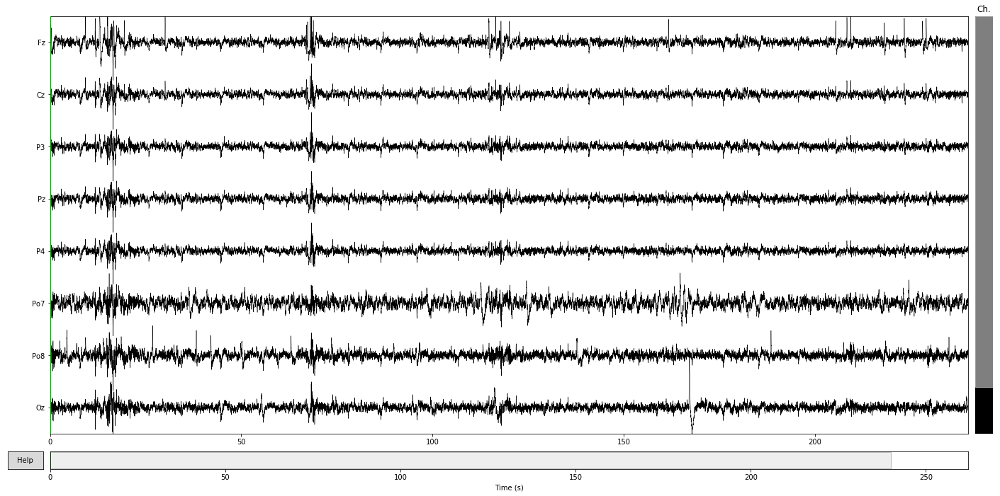

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Removing artifacts with 1
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.4s.
Transforming to ICA space (8 components)
Zeroing out 2 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=65502
    Range : 0 ... 65501 =      0.000 ...   262.004 secs
Ready.


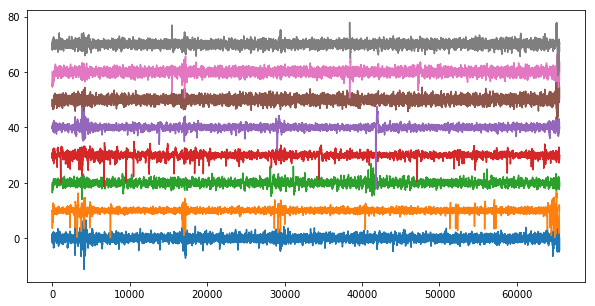

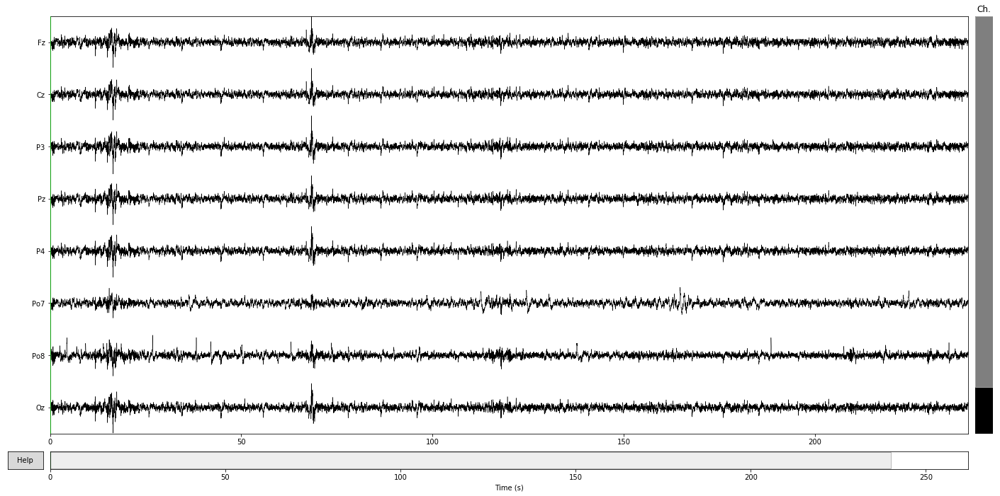

2700 events found
Event IDs: [1 2]
2700 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 2700 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-43-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



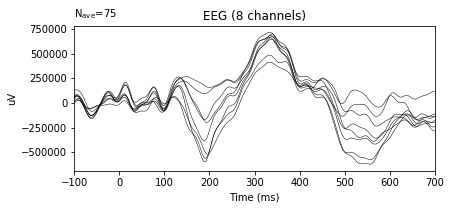

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-43-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



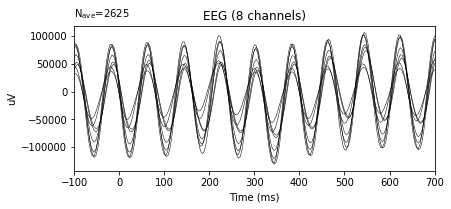

Averaging by 75 attemps


In [64]:
_ = process_signal(2, n_components=1)

# Modifications:
- Scaling - for baseline activity
- ICA components - for each attemp, use only correlated ?

# Get features

Creating RawArray with float64 data, n_channels=9, n_times=65282
    Range : 0 ... 65281 =      0.000 ...   261.124 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.
Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8


<ipython-input-45-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



Fitting ICA took 0.4s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=65282
    Range : 0 ... 65281 =      0.000 ...   261.124 secs
Ready.
2700 events found
Event IDs: [1 2]
2700 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 2700 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-229-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radi

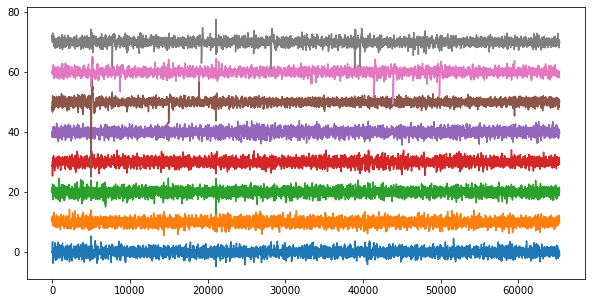

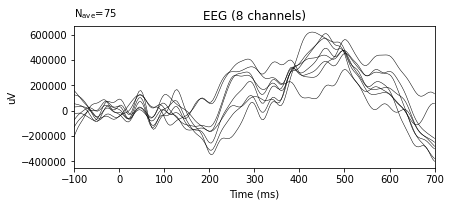

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-229-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radi

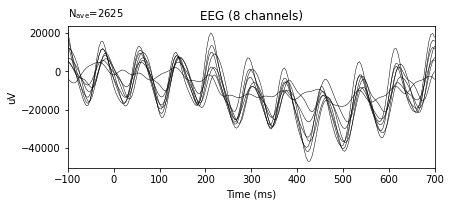

Averaging by 75 attemps



Creating RawArray with float64 data, n_channels=9, n_times=65502
    Range : 0 ... 65501 =      0.000 ...   262.004 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.
Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8


<ipython-input-45-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



Fitting ICA took 0.3s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=65502
    Range : 0 ... 65501 =      0.000 ...   262.004 secs
Ready.
2700 events found
Event IDs: [1 2]
2700 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 2700 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-229-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radi

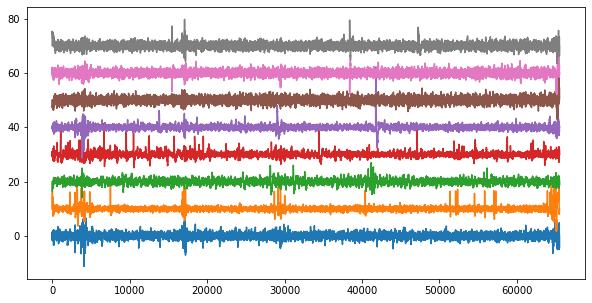

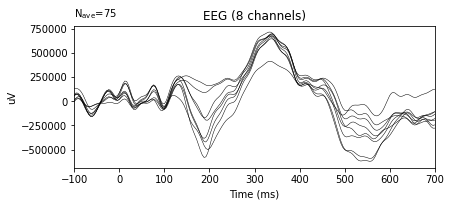

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-229-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radi

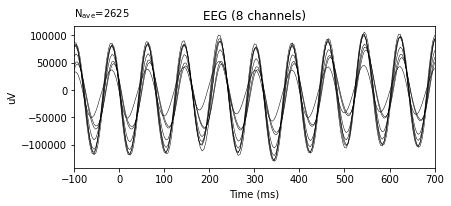

Averaging by 75 attemps



Creating RawArray with float64 data, n_channels=9, n_times=61866
    Range : 0 ... 61865 =      0.000 ...   247.460 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.
Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8


<ipython-input-45-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



Fitting ICA took 0.4s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=61866
    Range : 0 ... 61865 =      0.000 ...   247.460 secs
Ready.
900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-229-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radi

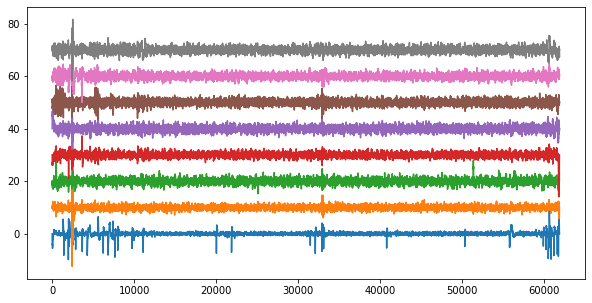

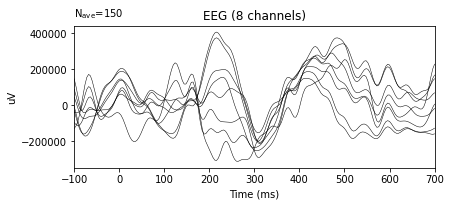

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-229-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radi

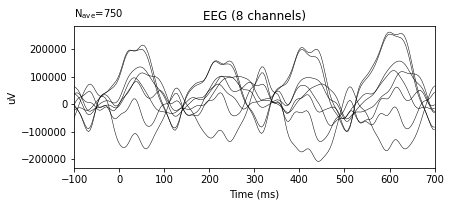

Averaging by 150 attemps



Creating RawArray with float64 data, n_channels=9, n_times=48901
    Range : 0 ... 48900 =      0.000 ...   195.600 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.
Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8


<ipython-input-45-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



Fitting ICA took 0.4s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=48901
    Range : 0 ... 48900 =      0.000 ...   195.600 secs
Ready.
900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-229-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radi

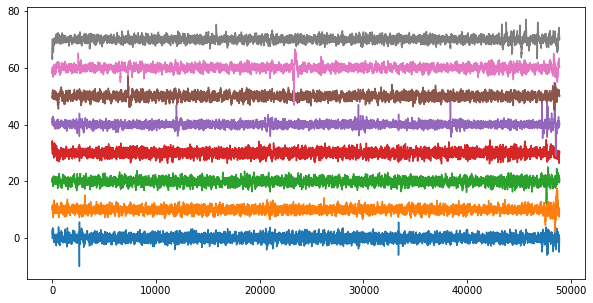

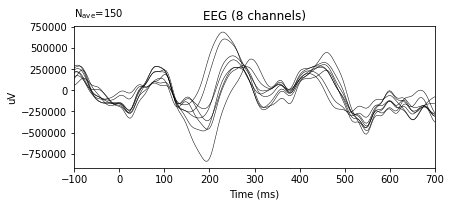

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-229-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radi

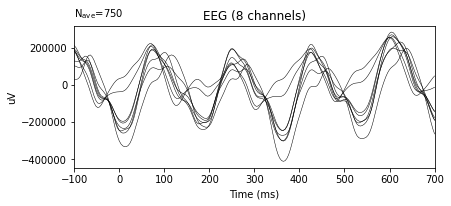

Averaging by 150 attemps



Creating RawArray with float64 data, n_channels=9, n_times=58682
    Range : 0 ... 58681 =      0.000 ...   234.724 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.
Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8


<ipython-input-45-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



Fitting ICA took 0.3s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=58682
    Range : 0 ... 58681 =      0.000 ...   234.724 secs
Ready.
900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-229-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radi

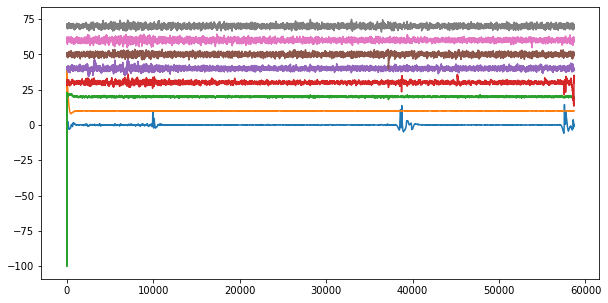

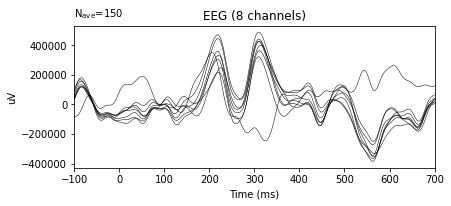

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-229-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radi

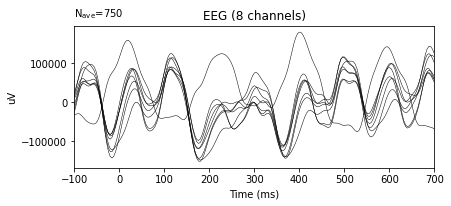

Averaging by 150 attemps



Creating RawArray with float64 data, n_channels=9, n_times=25327
    Range : 0 ... 25326 =      0.000 ...   101.304 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.
Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8


<ipython-input-45-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



Fitting ICA took 0.2s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=25327
    Range : 0 ... 25326 =      0.000 ...   101.304 secs
Ready.
900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-229-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radi

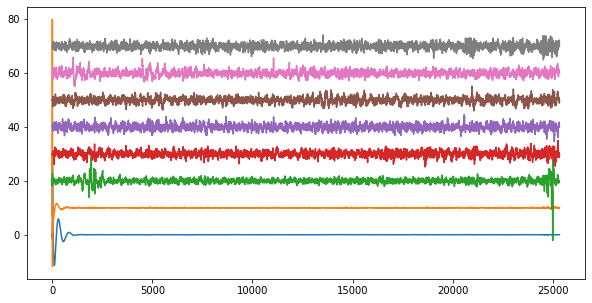

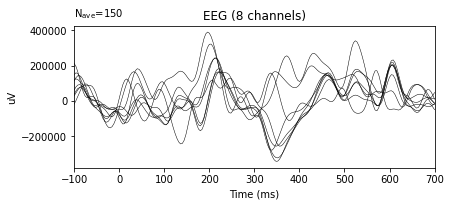

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-229-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radi

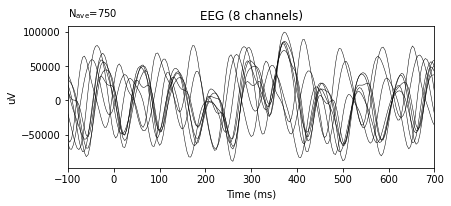

Averaging by 150 attemps



Creating RawArray with float64 data, n_channels=9, n_times=28806
    Range : 0 ... 28805 =      0.000 ...   115.220 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.
Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8


<ipython-input-45-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



Fitting ICA took 0.2s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=28806
    Range : 0 ... 28805 =      0.000 ...   115.220 secs
Ready.
900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-229-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radi

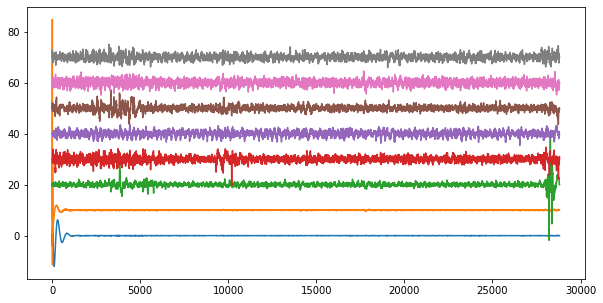

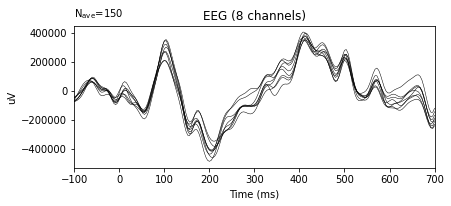

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-229-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radi

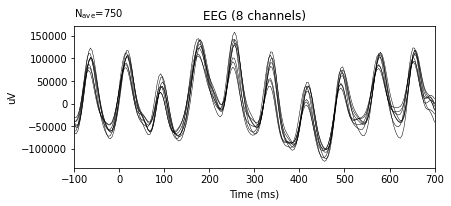

Averaging by 150 attemps



Creating RawArray with float64 data, n_channels=9, n_times=28901
    Range : 0 ... 28900 =      0.000 ...   115.600 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.
Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.1s.


<ipython-input-45-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=28901
    Range : 0 ... 28900 =      0.000 ...   115.600 secs
Ready.
900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-229-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radi

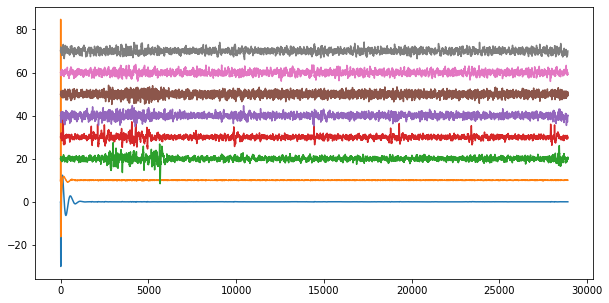

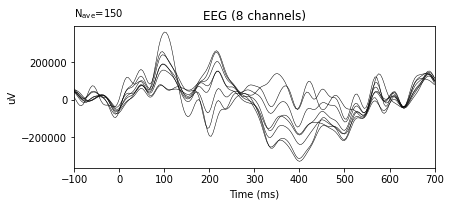

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-229-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radi

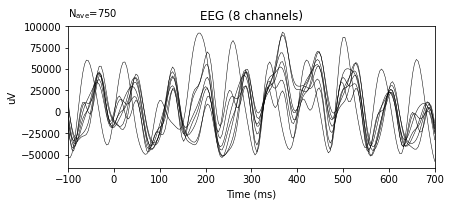

Averaging by 150 attemps



Creating RawArray with float64 data, n_channels=9, n_times=27940
    Range : 0 ... 27939 =      0.000 ...   111.756 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.
Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8


<ipython-input-45-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



Fitting ICA took 0.3s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=27940
    Range : 0 ... 27939 =      0.000 ...   111.756 secs
Ready.
900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-229-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radi

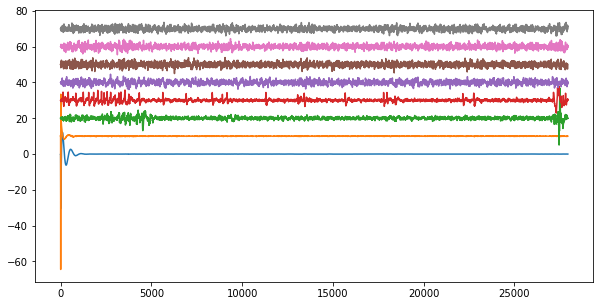

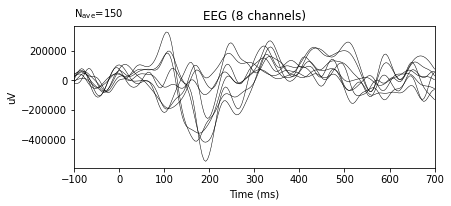

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-229-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radi

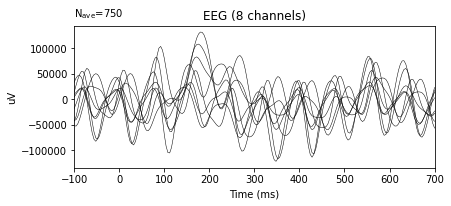

Averaging by 150 attemps



Creating RawArray with float64 data, n_channels=9, n_times=25587
    Range : 0 ... 25586 =      0.000 ...   102.344 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.
Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.1s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=25587
    Range : 0 ... 25586 =      0.000 ...   102.344 secs
Ready.
900 events found
Event IDs: [1 2]


<ipython-input-45-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-229-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radi

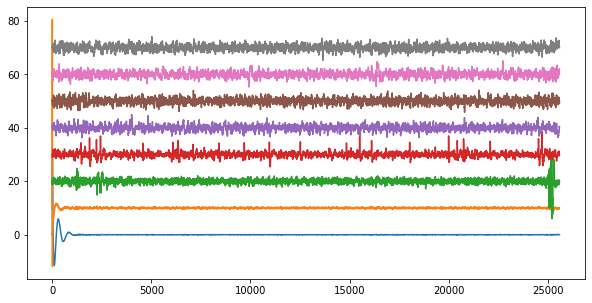

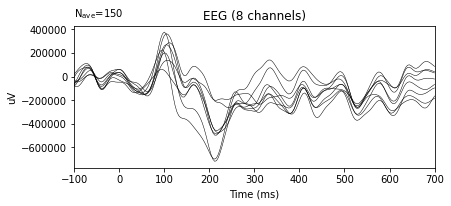

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-229-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radius via set_picker is deprecated since 3.3 and will be removed two minor releases later; use set_pickradius instead.

/usr/local/lib/python3.6/site-packages/mne/viz/evoked.py:399: MatplotlibDeprecationWarning:

Setting the line's pick radi

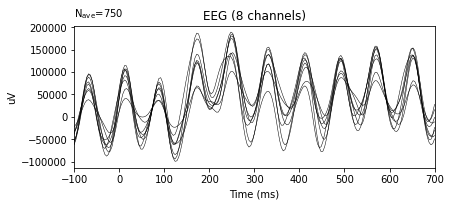

Averaging by 150 attemps


In [237]:
all_features = []

for i in range(1, 11):
    features = process_signal(i)
    all_features += features

# Visualization of subject differences

In [96]:
import seaborn as sns

In [97]:
all_features_df = pd.DataFrame(all_features, columns=[
    "latency", "erp_start_amplitude", "erp_end_amplitude", "erp_start_delay", "erp_end_delay", "channel", "subject", "trial"
])

In [98]:
all_features_df.head()

,latency,erp_start_amplitude,erp_end_amplitude,erp_start_delay,erp_end_delay,channel,subject,trial
0,340.0,0.059191,0.048901,20.0,20.0,0,S1,10
1,248.0,0.823816,0.165460,64.0,24.0,1,S1,10
2,376.0,0.509993,0.497079,48.0,36.0,2,S1,10
3,256.0,1.070776,0.529276,56.0,72.0,3,S1,10
4,252.0,0.930811,0.347804,76.0,76.0,4,S1,10


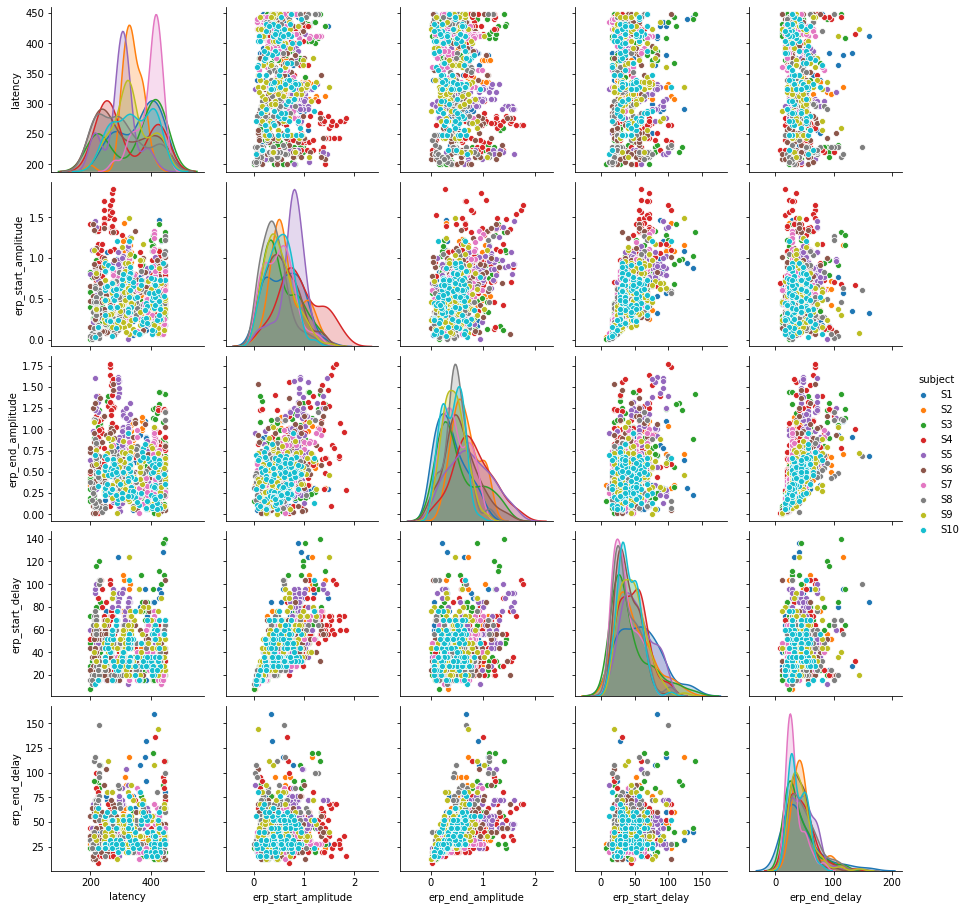

In [99]:
sns.pairplot(all_features_df, vars=["latency", "erp_start_amplitude", "erp_end_amplitude", "erp_start_delay", "erp_end_delay"], hue="subject")

<AxesSubplot:>

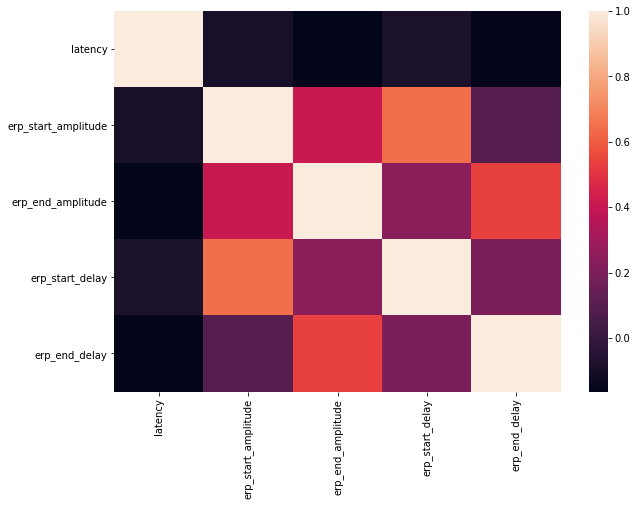

In [100]:
plt.figure(figsize=(10, 7))
sns.heatmap(all_features_df[["latency", "erp_start_amplitude", "erp_end_amplitude", "erp_start_delay", "erp_end_delay"]].corr())

In [109]:
all_features_df[all_features_df["channel"] == 1]

,latency,erp_start_amplitude,erp_end_amplitude,erp_start_delay,erp_end_delay,channel,subject,trial
1,248.0,0.823816,0.165460,64.0,24.0,1,S1,10
9,236.0,0.255754,0.386501,24.0,32.0,1,S1,20
17,412.0,0.333030,0.683669,84.0,160.0,1,S1,30
25,348.0,0.664264,0.615049,44.0,64.0,1,S1,40
33,284.0,0.972412,0.723133,64.0,40.0,1,S1,50
41,364.0,0.771142,0.929927,80.0,108.0,1,S1,60
49,308.0,1.210692,0.539358,76.0,28.0,1,S2,10
57,336.0,0.361417,0.566178,76.0,76.0,1,S2,20
65,304.0,0.653969,0.510844,40.0,48.0,1,S2,30
73,372.0,0.494754,1.095430,24.0,32.0,1,S2,40


In [116]:
merged_features_df = all_features_df[all_features_df["channel"] == 0].drop(
    columns=["channel"]
).copy()


for channel in range(1, 8):
    channel_features_df = all_features_df[all_features_df["channel"] == 0].drop(
        columns=["channel"]
    ).copy()
    merged_features_df = merged_features_df.merge(channel_features_df, on=["subject", "trial"], suffixes=('', str(channel)))

In [203]:
selected_features_df = merged_features_df[merged_features_df["trial"] > 50]

In [204]:
features_df = selected_features_df.drop(columns=["subject", "trial"])

In [205]:
scaler = StandardScaler()
features = scaler.fit_transform(features_df)

In [206]:
pca = PCA(n_components=2)
pca_features = pca.fit_transform(features)

In [207]:
pca.explained_variance_ratio_

array([0.51818624, 0.19738024])

In [208]:
from sklearn.cluster import KMeans

In [209]:
cluster = KMeans(n_clusters=5)
clusters = cluster.fit_predict(features)

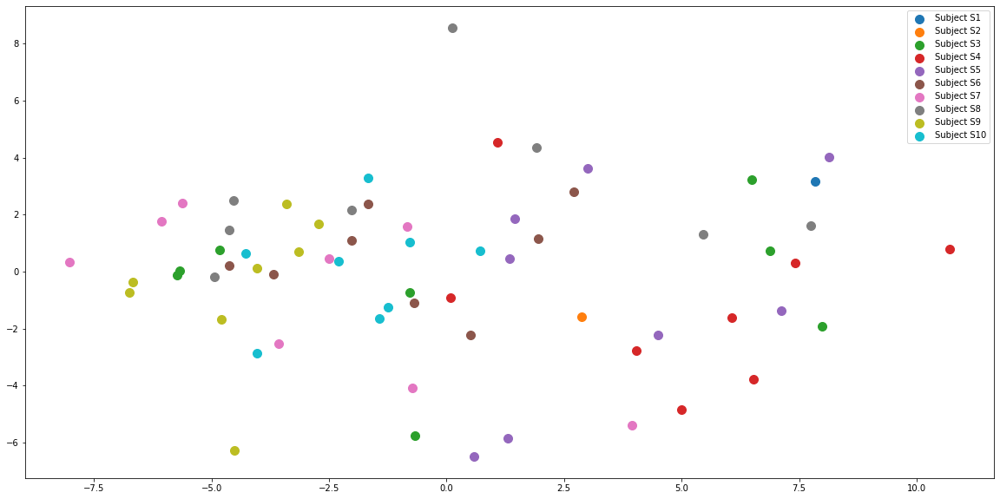

In [210]:
for cluster in selected_features_df["subject"].unique():
    subject_indices = selected_features_df["subject"] == cluster
    plt.scatter(pca_features[subject_indices].T[0], pca_features[subject_indices].T[1], s=100, label="Subject {}".format(cluster))

plt.legend()

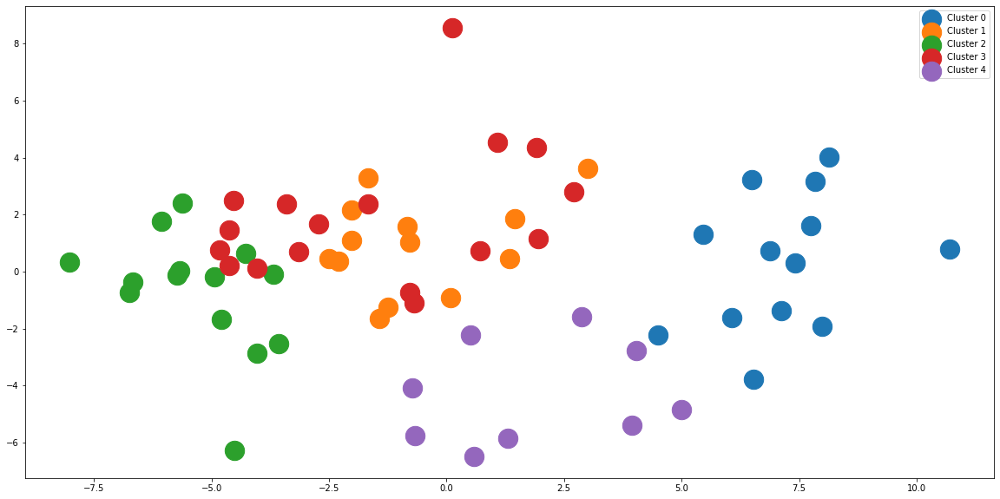

In [212]:
for cluster in range(0, 5):
    subject_indices = clusters == cluster
    plt.scatter(pca_features[subject_indices].T[0], pca_features[subject_indices].T[1], s=500, label="Cluster {}".format(cluster))

plt.legend()

In [213]:
clusters_df = pd.DataFrame()
clusters_df["subject"] = selected_features_df["subject"]
clusters_df["cluster"] = clusters

In [214]:
clusters_df.groupby(["subject", "cluster"]).size().reset_index().sort_values(0, ascending=False).groupby("subject")["cluster"].first().sort_values()

subject
S1     0
S3     0
S4     0
S5     0
S10    1
S7     2
S6     3
S8     3
S9     3
S2     4
Name: cluster, dtype: int64

In [106]:
px.scatter(
    all_features_df[all_features_df["channel"] == 0], 
    x="erp_start_amplitude", 
    y="erp_end_amplitude", 
    color="subject",
    size="trial"
)

In [107]:
px.scatter(
    all_features_df[all_features_df["channel"] == 0], 
    x="erp_start_amplitude", 
    y="erp_start_delay", 
    color="subject",
    size="trial"
)

# TODO Visualization of intertrial differences

# TODO show how the features change with avg window

# Create feature array

Creating RawArray with float64 data, n_channels=9, n_times=65282
    Range : 0 ... 65281 =      0.000 ...   261.124 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-21-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



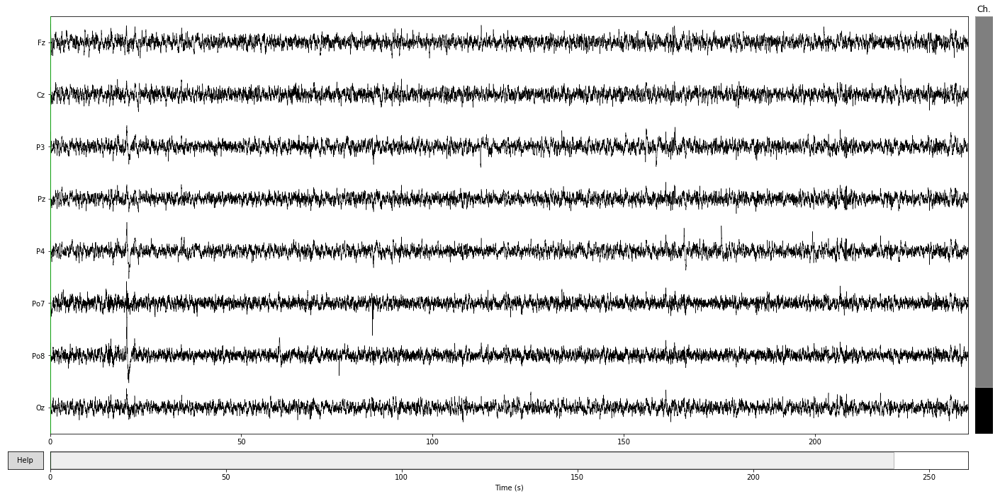

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.7s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=65282
    Range : 0 ... 65281 =      0.000 ...   261.124 secs
Ready.


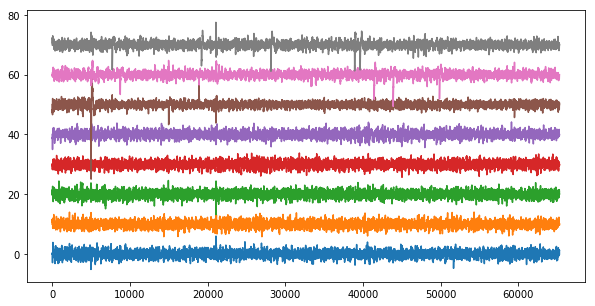

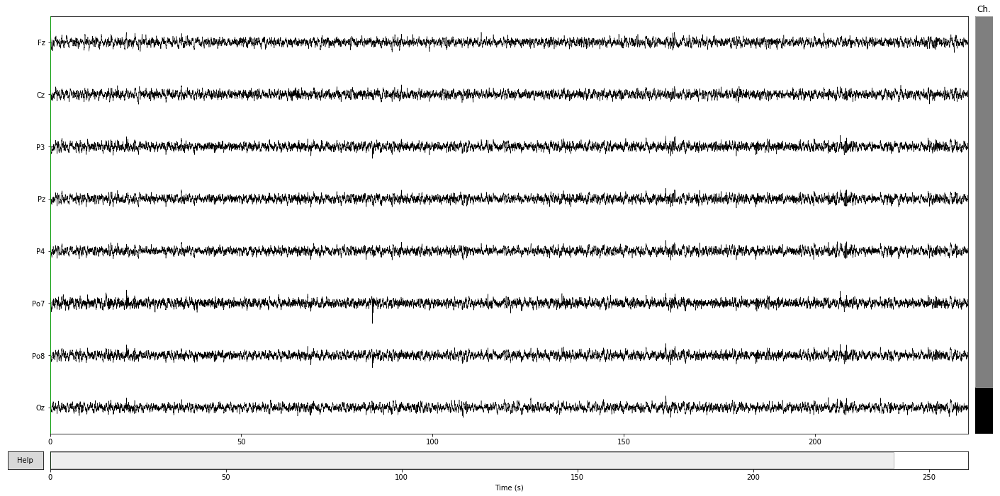

2700 events found
Event IDs: [1 2]
2700 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 2700 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



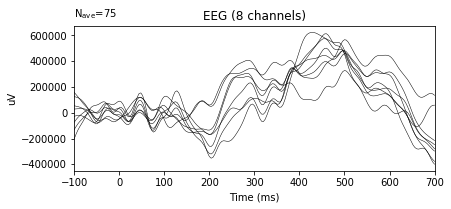

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



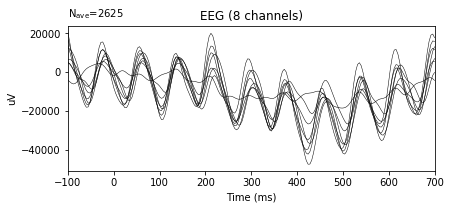

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.
Creating RawArray with float64 data, n_channels=9, n_times=65502
    Range : 0 ... 65501 =      0.000 ...   262.004 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-35-458787da969f>:5: RuntimeWarning:

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.

<ipython-input-21-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



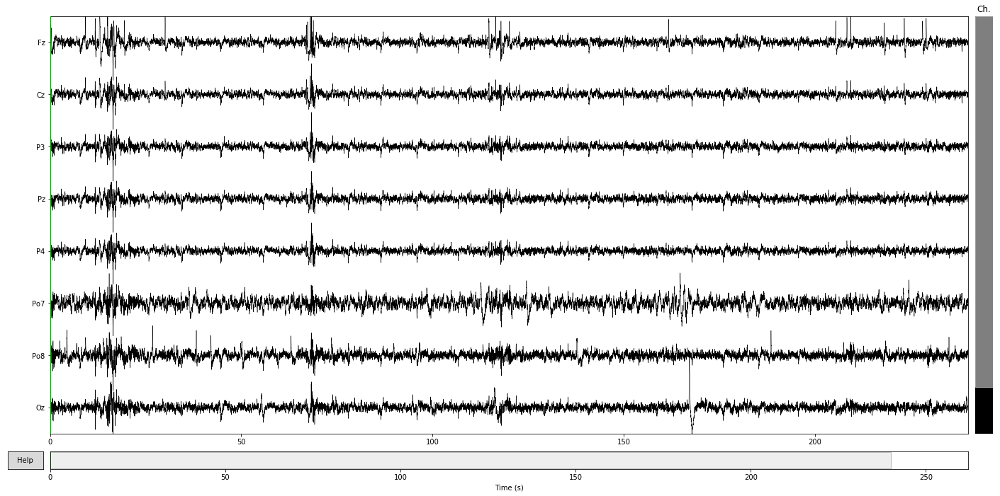

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.5s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=65502
    Range : 0 ... 65501 =      0.000 ...   262.004 secs
Ready.


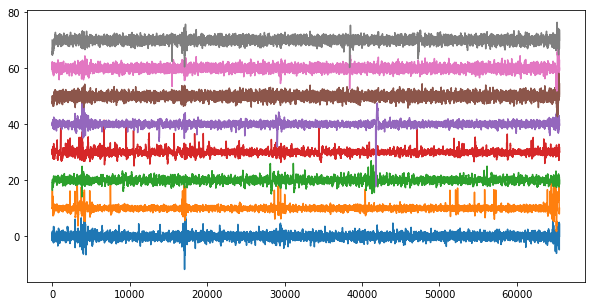

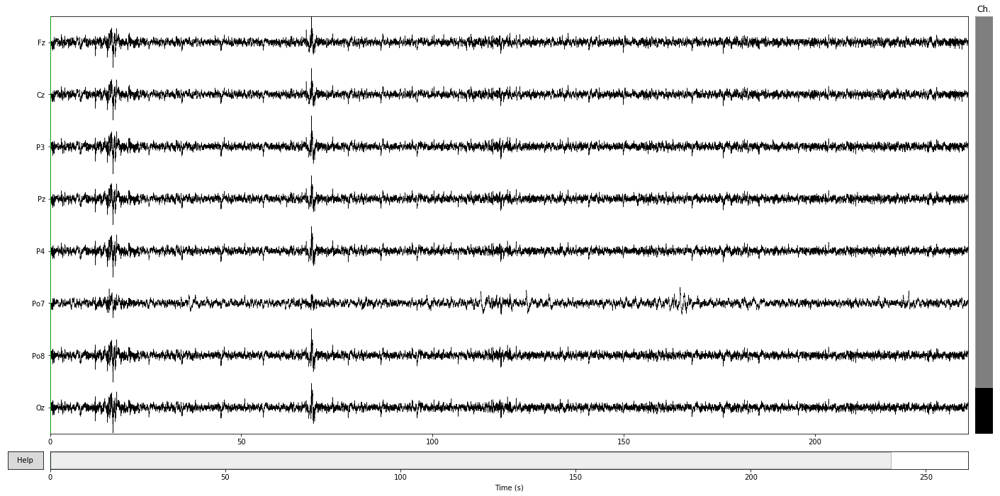

2700 events found
Event IDs: [1 2]
2700 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 2700 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



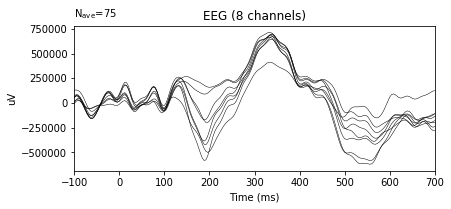

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



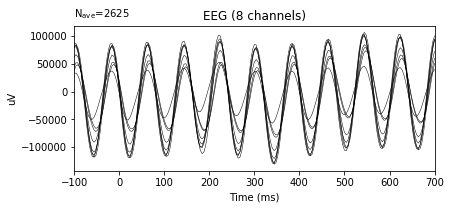

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.
Creating RawArray with float64 data, n_channels=9, n_times=61866
    Range : 0 ... 61865 =      0.000 ...   247.460 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-35-458787da969f>:5: RuntimeWarning:

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.

<ipython-input-21-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



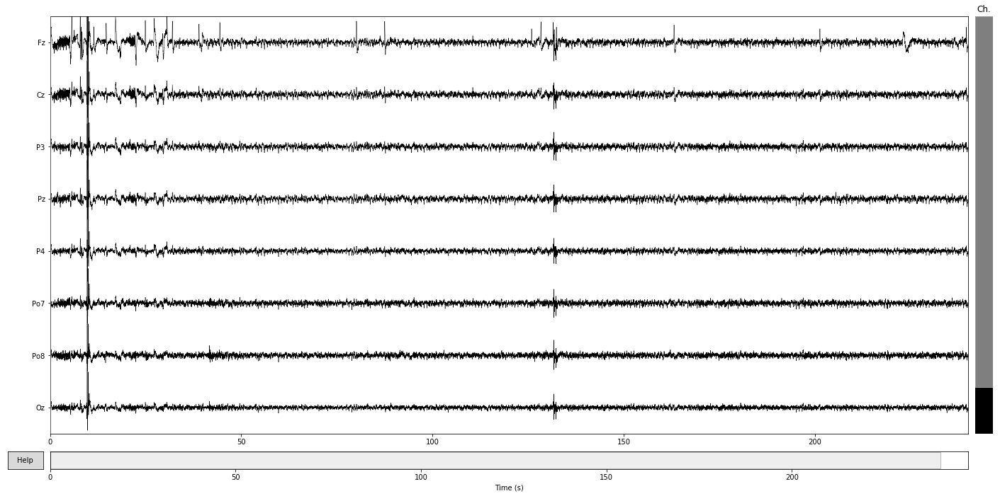

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.6s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=61866
    Range : 0 ... 61865 =      0.000 ...   247.460 secs
Ready.


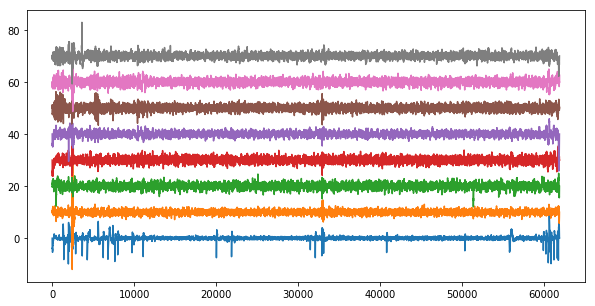

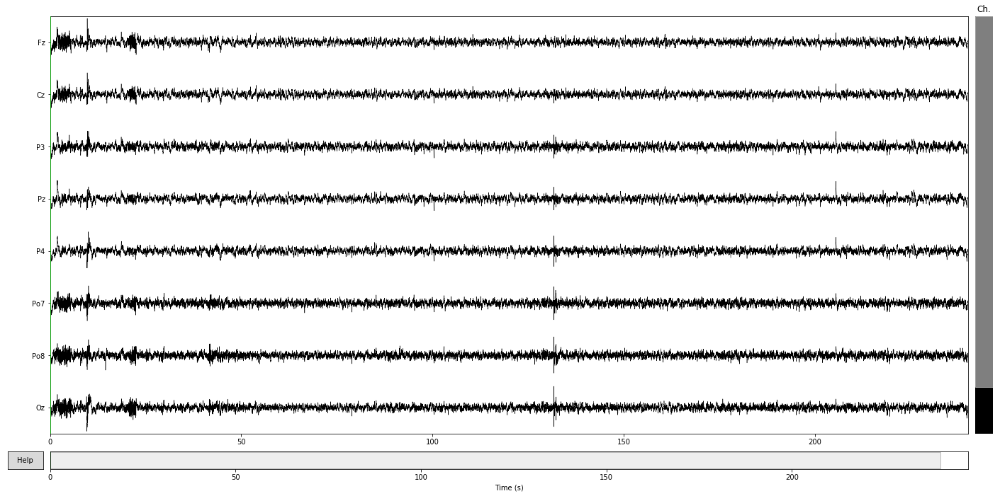

900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



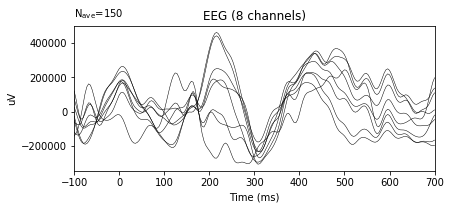

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



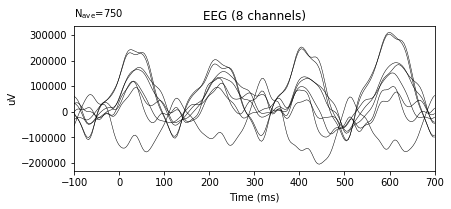

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.
Creating RawArray with float64 data, n_channels=9, n_times=48901
    Range : 0 ... 48900 =      0.000 ...   195.600 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-35-458787da969f>:5: RuntimeWarning:

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.

<ipython-input-21-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



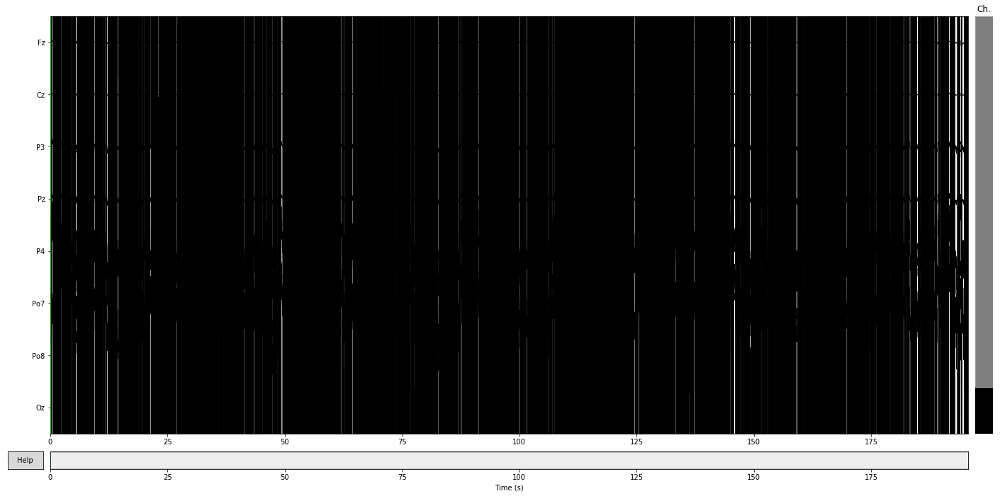

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.3s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=48901
    Range : 0 ... 48900 =      0.000 ...   195.600 secs
Ready.


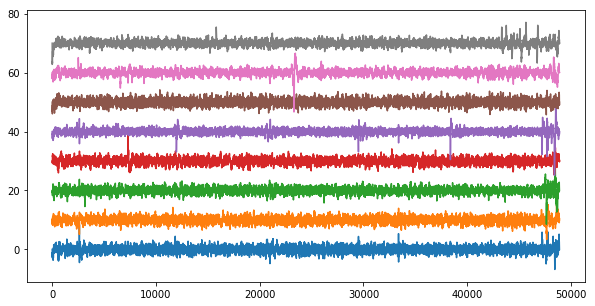

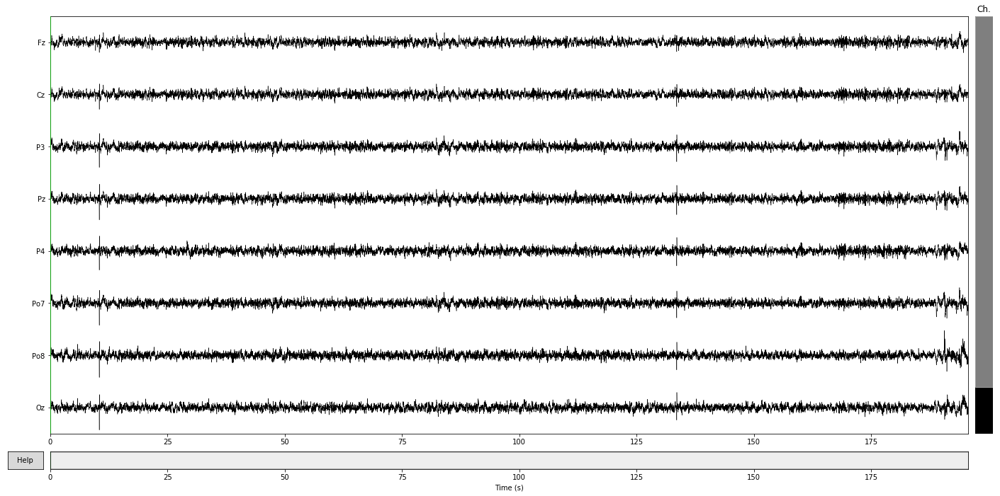

900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



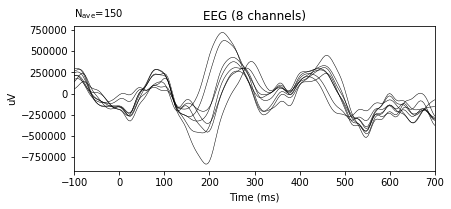

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



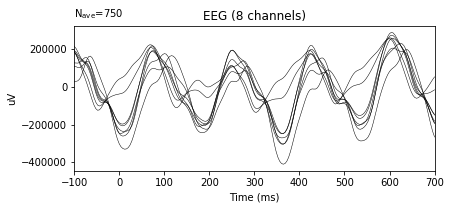

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.
Creating RawArray with float64 data, n_channels=9, n_times=58682
    Range : 0 ... 58681 =      0.000 ...   234.724 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-35-458787da969f>:5: RuntimeWarning:

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.

<ipython-input-21-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



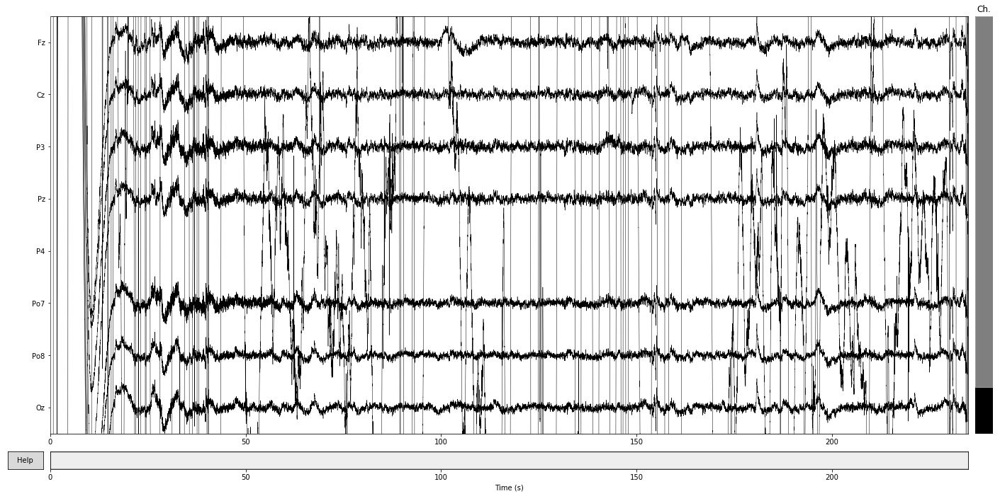

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.2s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=58682
    Range : 0 ... 58681 =      0.000 ...   234.724 secs
Ready.


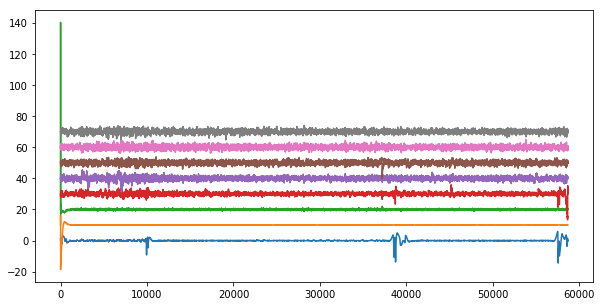

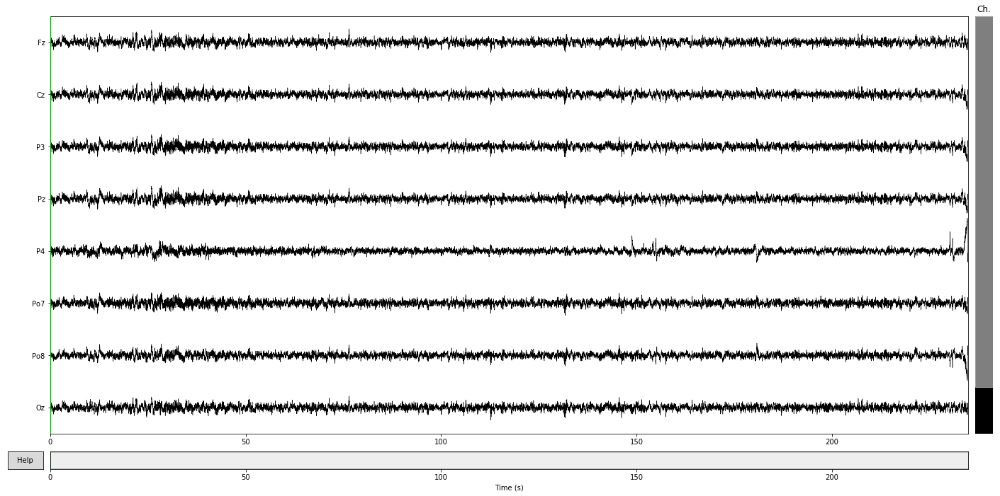

900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



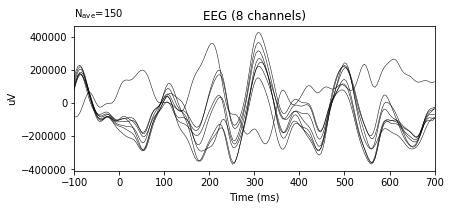

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



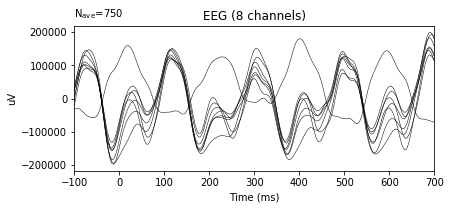

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.
Creating RawArray with float64 data, n_channels=9, n_times=25327
    Range : 0 ... 25326 =      0.000 ...   101.304 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-35-458787da969f>:5: RuntimeWarning:

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.

<ipython-input-21-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



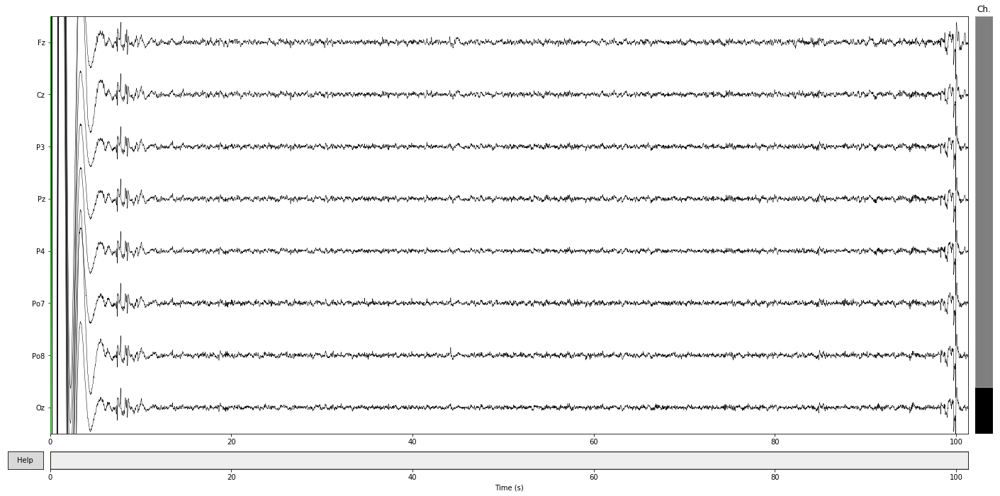

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.1s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=25327
    Range : 0 ... 25326 =      0.000 ...   101.304 secs
Ready.


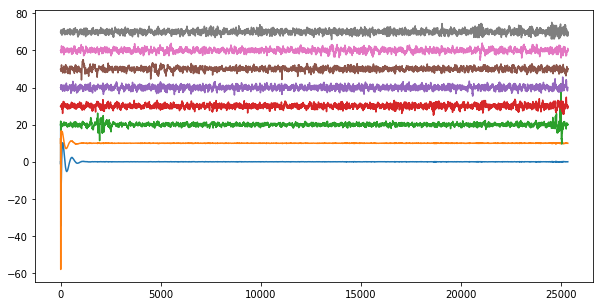

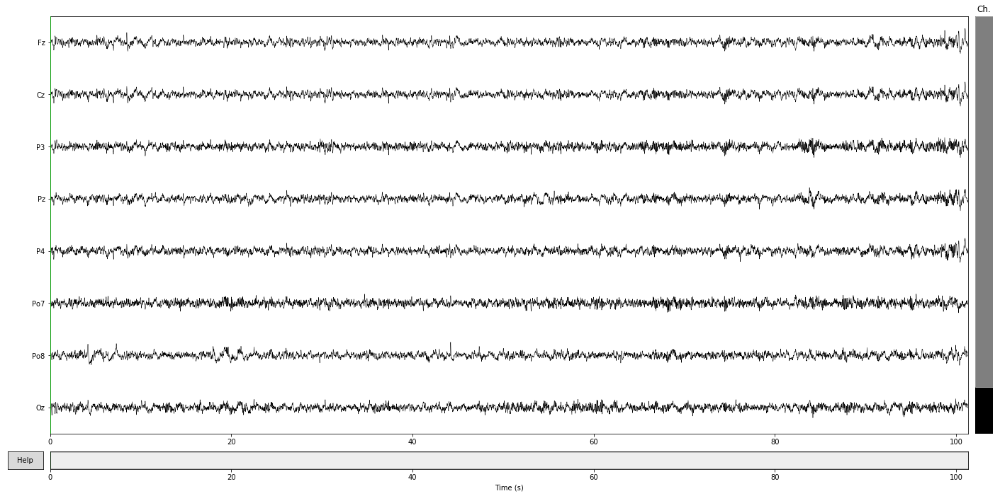

900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



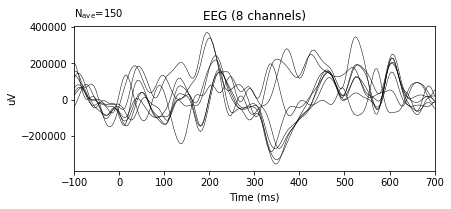

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



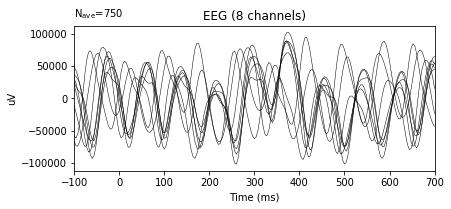

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.
Creating RawArray with float64 data, n_channels=9, n_times=28806
    Range : 0 ... 28805 =      0.000 ...   115.220 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-35-458787da969f>:5: RuntimeWarning:

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.

<ipython-input-21-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



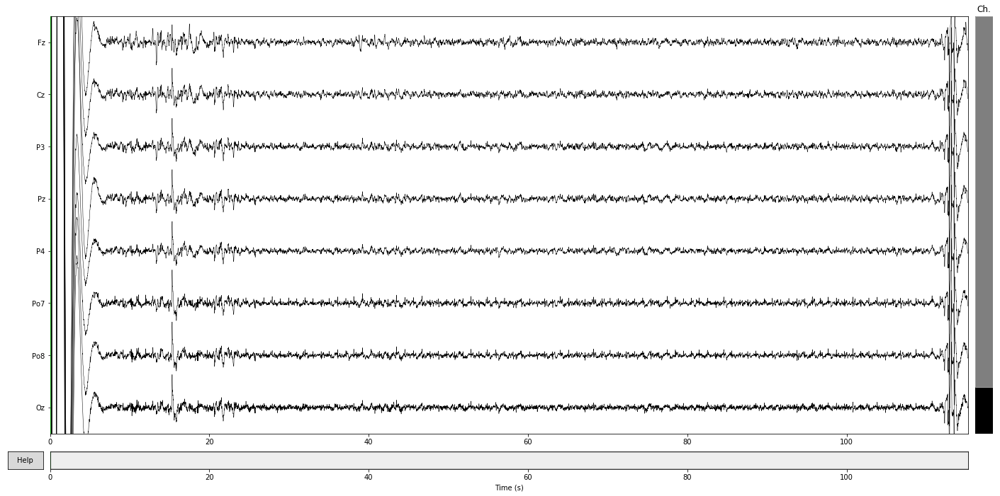

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.2s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=28806
    Range : 0 ... 28805 =      0.000 ...   115.220 secs
Ready.


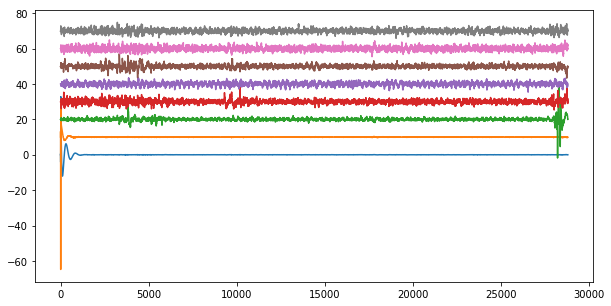

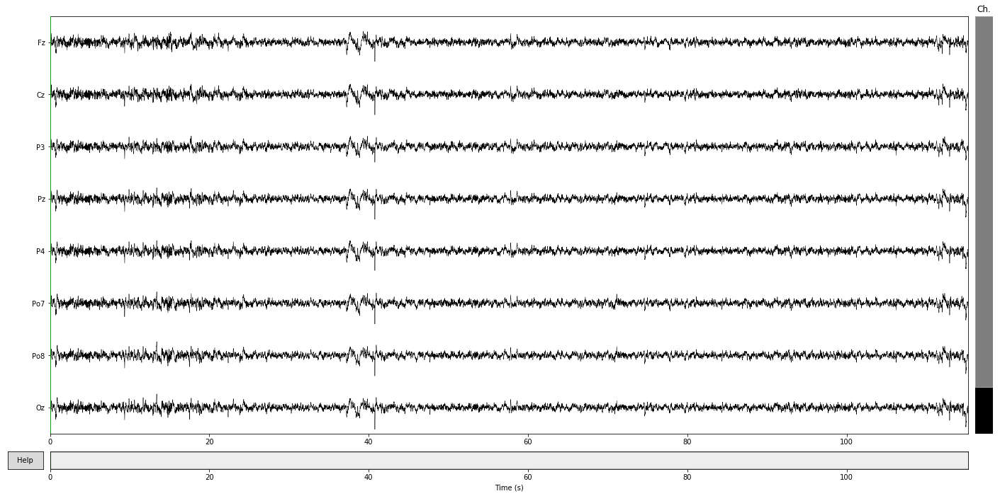

900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



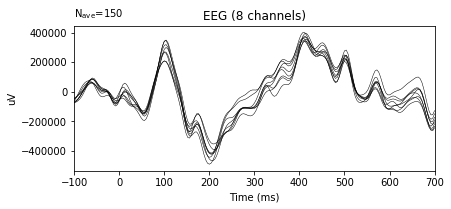

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



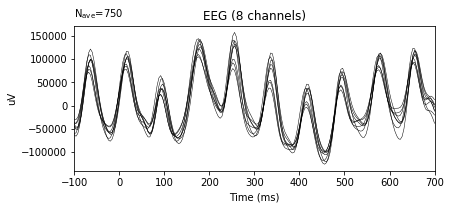

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.
Creating RawArray with float64 data, n_channels=9, n_times=28901
    Range : 0 ... 28900 =      0.000 ...   115.600 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-35-458787da969f>:5: RuntimeWarning:

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.

<ipython-input-21-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



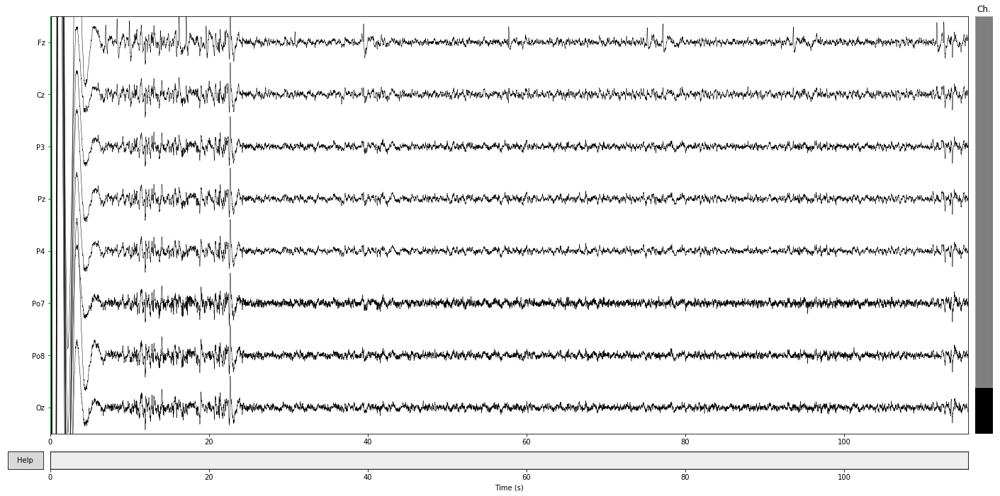

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.1s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=28901
    Range : 0 ... 28900 =      0.000 ...   115.600 secs
Ready.


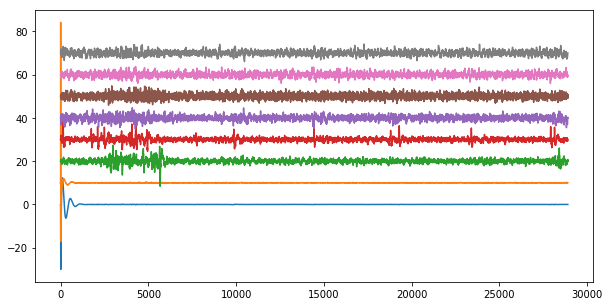

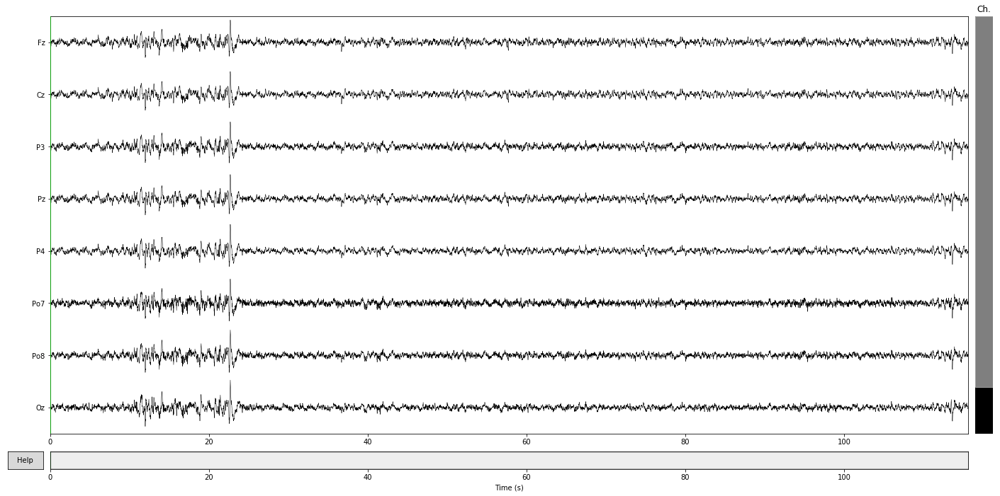

900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



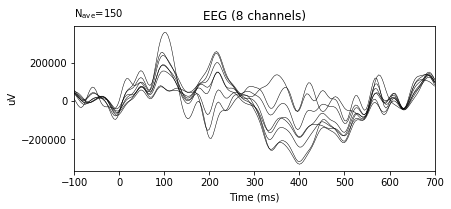

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



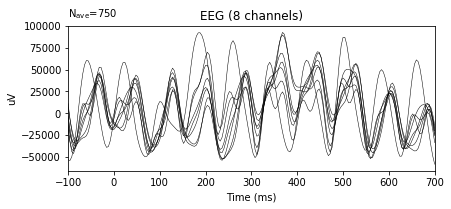

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.
Creating RawArray with float64 data, n_channels=9, n_times=27940
    Range : 0 ... 27939 =      0.000 ...   111.756 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-35-458787da969f>:5: RuntimeWarning:

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.

<ipython-input-21-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



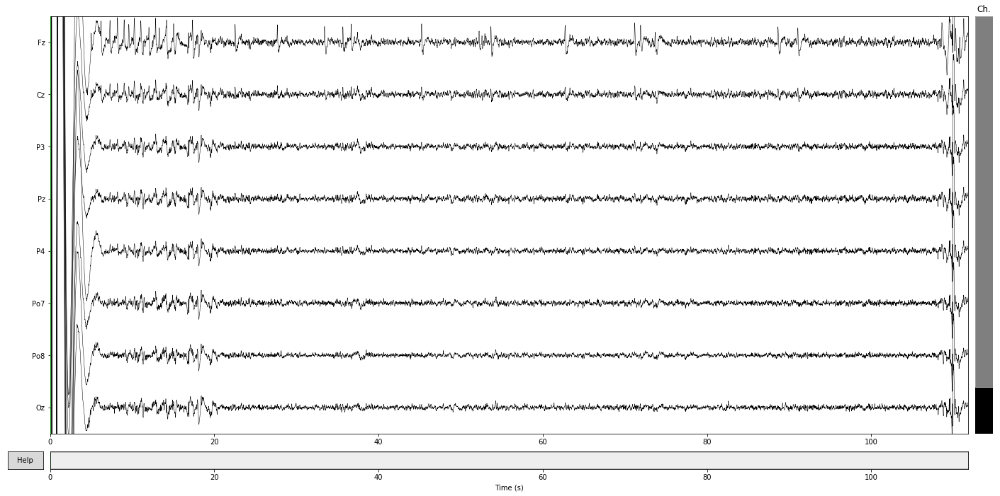

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.2s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=27940
    Range : 0 ... 27939 =      0.000 ...   111.756 secs
Ready.


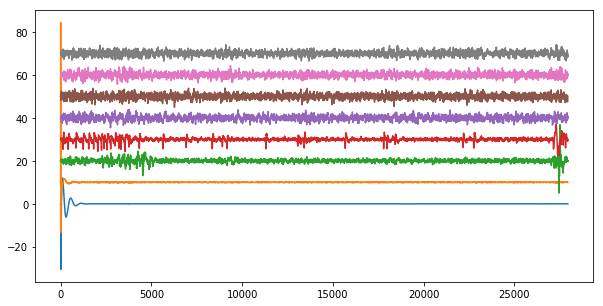

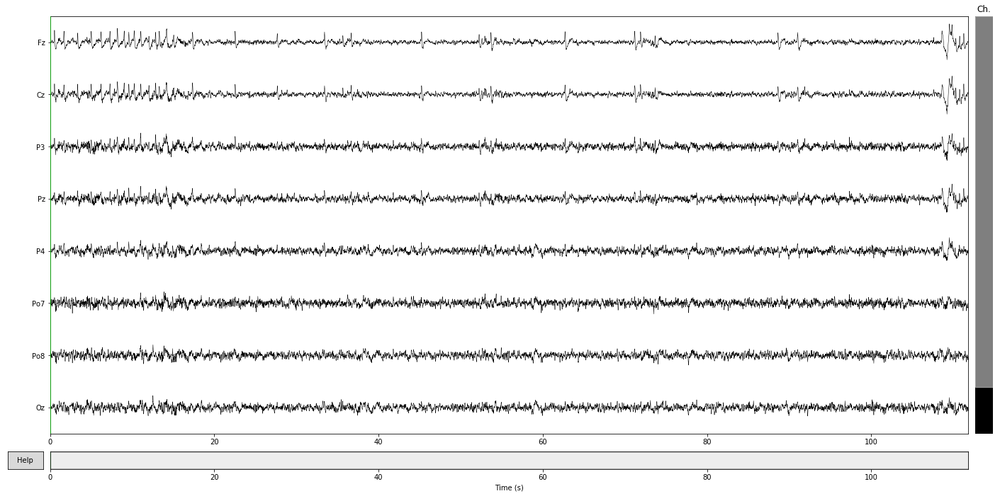

900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



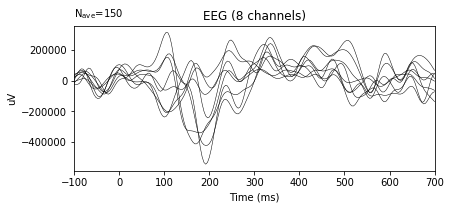

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



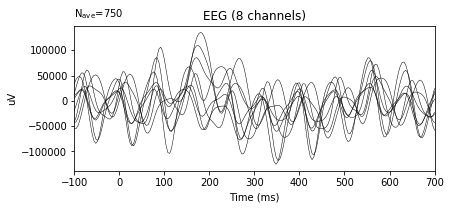

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.
Creating RawArray with float64 data, n_channels=9, n_times=25587
    Range : 0 ... 25586 =      0.000 ...   102.344 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-35-458787da969f>:5: RuntimeWarning:

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.

<ipython-input-21-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



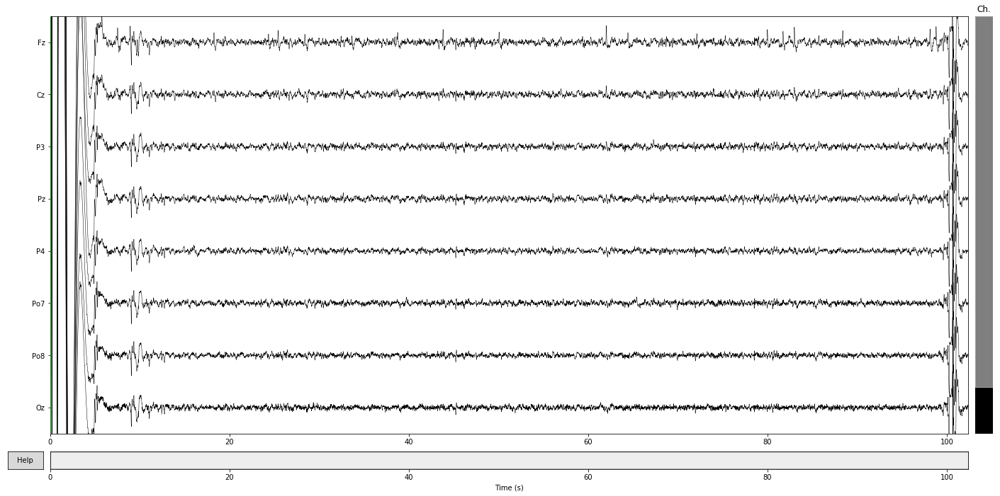

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.1s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=25587
    Range : 0 ... 25586 =      0.000 ...   102.344 secs
Ready.


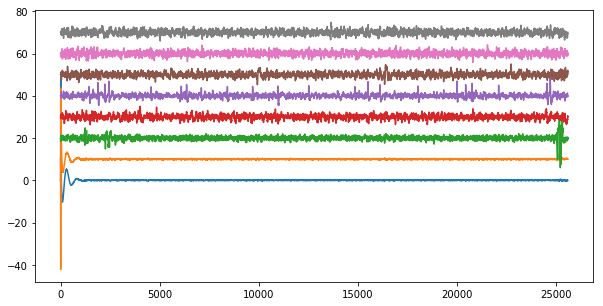

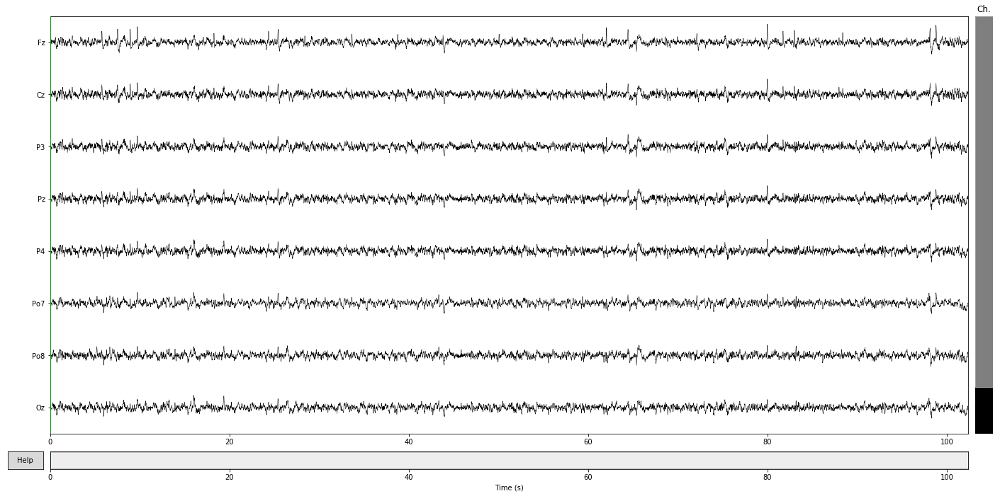

900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



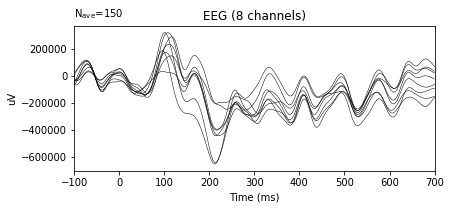

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-27-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



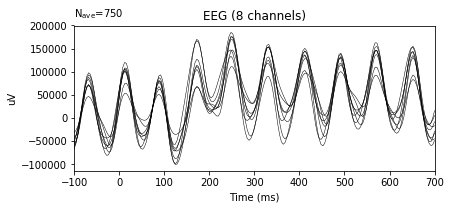

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.


<ipython-input-35-458787da969f>:5: RuntimeWarning:

The measurement information indicates a low-pass frequency of 30 Hz. The decim=12 parameter will result in a sampling frequency of 20.8333 Hz, which can cause aliasing artifacts.



In [35]:
all_epochs = []

for i in range(1, 11):
    epochs = process_signal(i, features_extraction=False)
    epochs = epochs.decimate(12)
    all_epochs += [epochs]

In [36]:
def get_dataset(epochs, class_label):
    events_X = epochs.get_data()
    events_X = events_X.reshape(events_X.shape[0], -1)
    
    events_y = [class_label] * events_X.shape[0]
    
    return events_X, events_y

In [37]:
i = 1

In [38]:
all_events_X = []
all_events_y = []

for epochs in all_epochs[i:i + 1]:
    positive_events_X, positive_events_y = get_dataset(epochs['1'], 1)
    negative_events_X, negative_events_y = get_dataset(epochs['2'], 0)
    
    all_events_X += [positive_events_X] + [negative_events_X]
    all_events_y += positive_events_y + negative_events_y

In [39]:
merged_events_X = np.vstack(all_events_X)

 # LDA decomposition and classification

In [43]:
def get_metric(model, grid, scoring="accuracy", return_model = False):
    search = GridSearchCV(model, grid, cv=3, scoring=scoring)
    search.fit(merged_events_X, all_events_y)
    if return_model:
        return search.best_estimator_
    return search.best_score_

Classification

In [44]:
grid = {
    "solver": ['svd']
}
model = LDA()
get_metric(model, grid)

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.



0.97

In [45]:
get_metric(model, grid, scoring= "roc_auc")

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.



0.8734476190476191

Visualization

In [46]:
all_events_y[-1] = 2 # Hack to get 2 components for decomposition

In [47]:
lda = get_metric(model, grid, return_model=True, scoring="accuracy")

/usr/local/lib/python3.6/site-packages/sklearn/model_selection/_split.py:652: Warning:

The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=3.

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/usr/local/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.



In [48]:
all_events_y[-1] = 0

In [49]:
def visualize_importances(importances):
    time = np.linspace(-100, 700, 17)
    for channel, values in zip(MAIN_CHANNELS, importances.reshape(8, -1)): 
        plt.plot(time, values, label=channel)
    plt.legend()
    plt.axvline(0, linestyle=":")

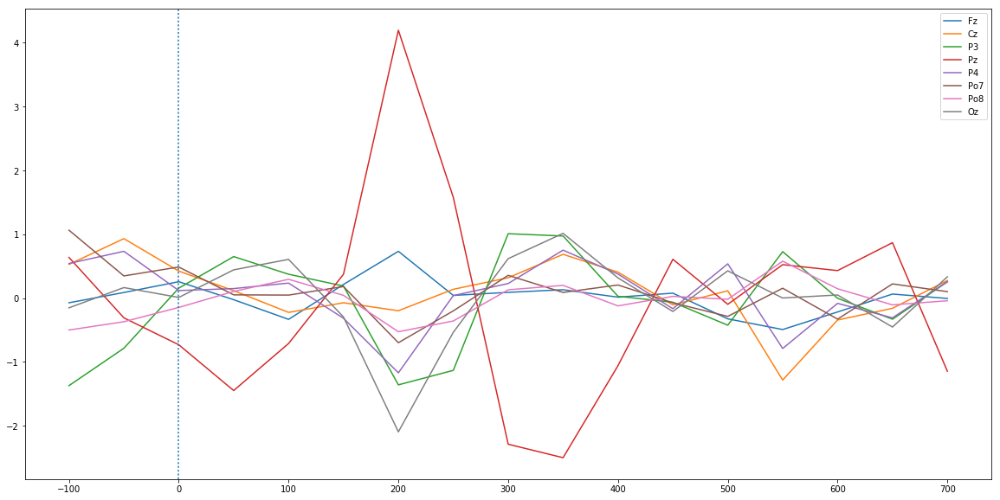

In [50]:
visualize_importances(lda.coef_[1])

In [51]:
lda_features = lda.transform(merged_events_X)

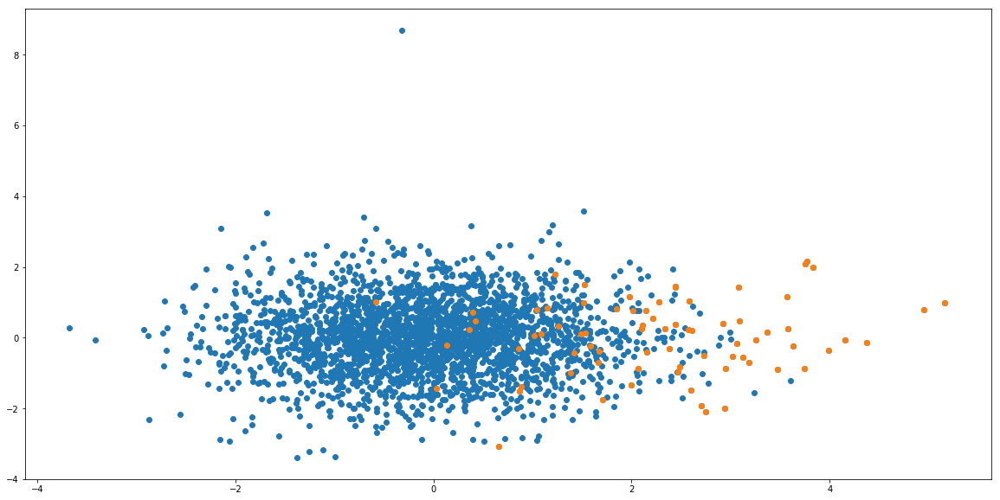

In [52]:
positive_indices = np.array(all_events_y) == 1

plt.scatter(lda_features.T[0], lda_features.T[1])
plt.scatter(lda_features.T[0][positive_indices], lda_features.T[1][positive_indices])

# Tree ensembles

In [53]:
grid = {
    "n_estimators": [10, 100],
    "max_depth": [3]
}
model = GradientBoostingClassifier()
# get_metric(model, grid)

In [54]:
get_metric(model, grid, scoring='roc_auc')

0.7134476190476191

In [55]:
ensemble = get_metric(model, grid, scoring='roc_auc', return_model=True)

In [56]:
ensemble

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              n_iter_no_change=None, presort='auto', random_state=None,
              subsample=1.0, tol=0.0001, validation_fraction=0.1,
              verbose=0, warm_start=False)

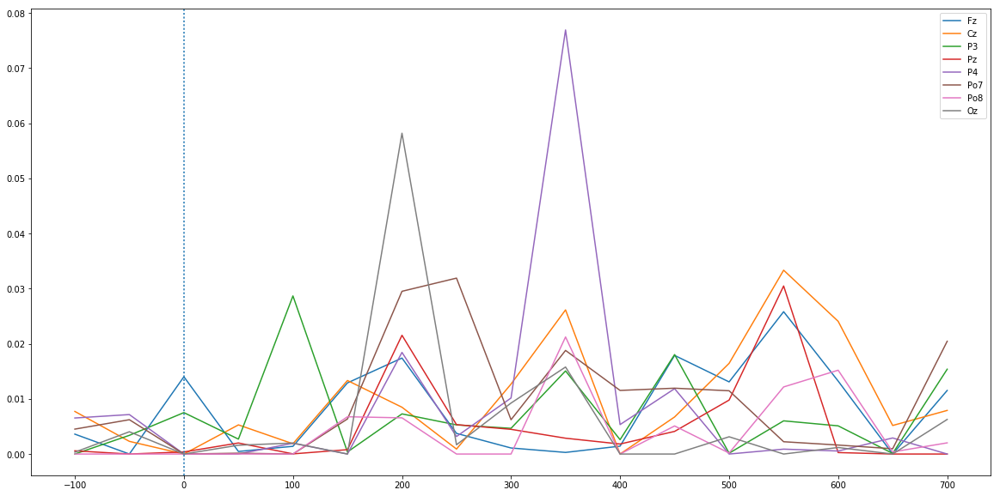

In [57]:
visualize_importances(ensemble.feature_importances_)

# Logistic Regression and Linear SVM

In [58]:
# grid = {
#     "reg_param": [0] + np.logspace(-2, 0, 100).tolist()
# }
# model = QDA()
# get_metric(model, grid, "roc_auc")

In [59]:
# get_metric(model, grid, "roc_auc", return_model=True)

In [60]:
grid = {
    "C": np.logspace(-3, 0, 20).tolist(),
    "kernel": ['linear', 'poly', 'rbf', 'sigmoid']
}
model = SVC(gamma='scale')
get_metric(model, grid, "roc_auc")

0.8522819047619047

In [61]:
svm = get_metric(model, grid, "roc_auc", return_model=True)

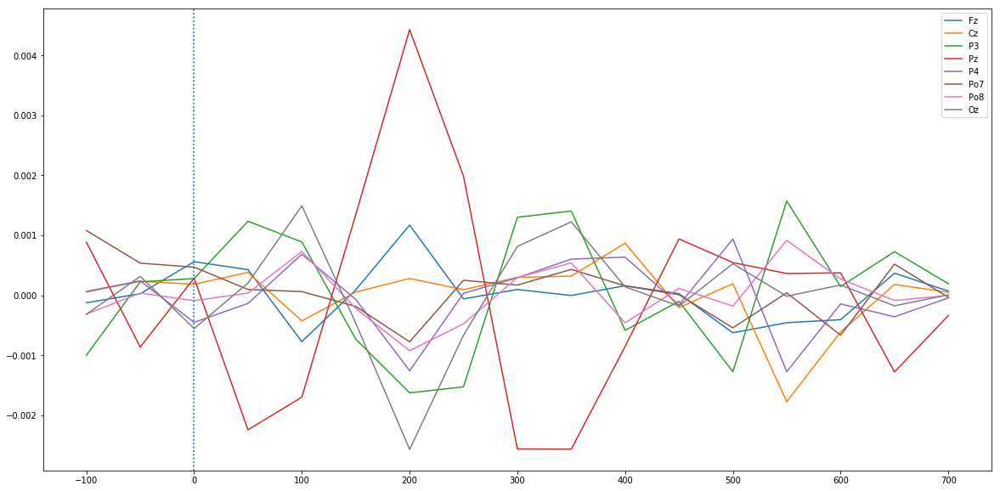

In [62]:
visualize_importances(svm.coef_[0])

In [63]:
grid = {
    "C": np.logspace(-3, 1, 100).tolist()
}
model = LogisticRegression(solver='liblinear')
get_metric(model, grid, "roc_auc")

0.8586209523809524

In [64]:
logreg = get_metric(model, grid, "roc_auc", return_model=True)

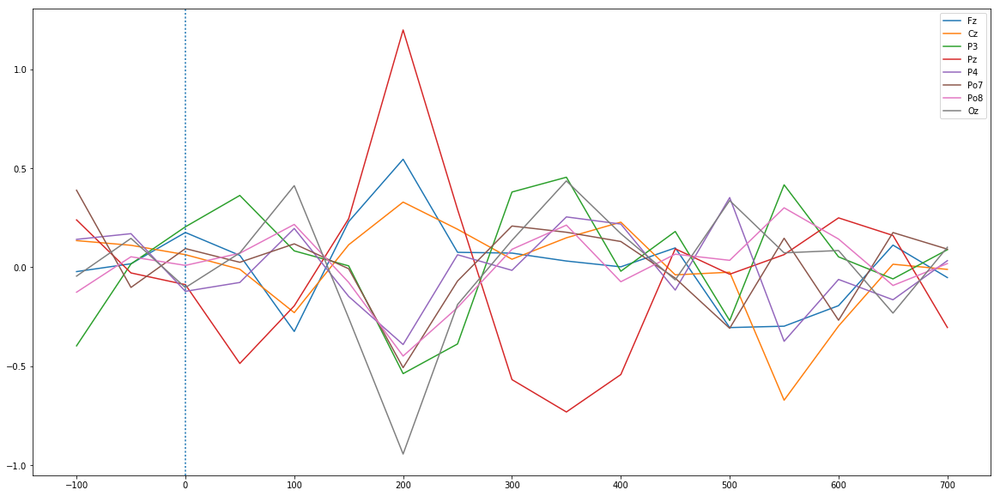

In [65]:
visualize_importances(logreg.coef_[0])

# TODO The sections below are experimental!

# Why some samples are not so good to classify?

In [66]:
grid = {
    "solver": ['svd']
}
model = LDA()

In [68]:
lda = get_metric(model, grid, return_model=True, scoring="roc_auc")

/home/noomkcalb/.local/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/home/noomkcalb/.local/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/home/noomkcalb/.local/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.

/home/noomkcalb/.local/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:388: UserWarning:

Variables are collinear.



In [69]:
probabilities = lda.predict_proba(merged_events_X).T[1]

In [70]:
positive_indices = np.array(all_events_y) == 1

In [71]:
positive_events = merged_events_X[positive_indices]

In [72]:
correction_classes = probabilities[positive_indices] < 0.5

In [73]:
features_df = pd.DataFrame()

In [74]:
features_df["class"] = correction_classes

In [75]:
reshaped_positive_events = positive_events.reshape(positive_events.shape[0], 8, -1)

In [76]:
for index, channel in enumerate(MAIN_CHANNELS):
    features_df["mean_{}".format(channel)] = reshaped_positive_events[:, index, :].mean(axis=-1)
    features_df["std_{}".format(channel)] = reshaped_positive_events[:, index, :].std(axis=-1)

In [77]:
closest_pairs = [
    ("Fz", "Cz"),
    ("Cz", "Pz"),
    ("P3", "Pz"),
    ("Pz", "P4"),
    ("Po7", "P3"),
    ("Po8", "P4"),
    ("Pz", "Oz")
]

In [78]:
for (c1, c2) in closest_pairs:
    print(c1, c2)
    index1 = MAIN_CHANNELS.index(c1)
    index2 = MAIN_CHANNELS.index(c2)
    coefs = []
    for attemp in reshaped_positive_events:
        coefs.append(np.corrcoef(attemp[index1], attemp[index2])[0, 1])
    features_df["cov_{}_{}".format(c1, c2)] = coefs

Fz Cz
Cz Pz
P3 Pz
Pz P4
Po7 P3
Po8 P4
Pz Oz


In [79]:
all_features += [features_df]

In [80]:
all_features_df = pd.concat(all_features).reset_index(drop=True)

TypeError: cannot concatenate object of type "<class 'tuple'>"; only pd.Series, pd.DataFrame, and pd.Panel (deprecated) objs are valid

In [81]:
# for c1, c2 in closest_pairs:
#     all_features_df[all_features_df["class"]]["cov_{}_{}".format(c1, c2)].plot(kind='hist', alpha=0.5, normed=True)
#     all_features_df[~all_features_df["class"]]["cov_{}_{}".format(c1, c2)].plot(kind='hist', alpha=0.5, normed=True)
#     plt.show()

In [82]:
model = SVC(gamma='scale', kernel='linear')
grid = {"C": np.logspace(-5, -2, 100)}
# grid = {"n_estimators": [1000]}
search = GridSearchCV(model, grid, cv=3, scoring="roc_auc")
search.fit(all_features_df.drop(columns="class"), all_features_df["class"])

KeyError: "['class'] not found in axis"

In [ ]:
search.best_estimator_

In [ ]:
search.best_score_

In [ ]:
eli5.explain_weights(search.best_estimator_, feature_names=list(all_features_df.drop(columns=["class"]).columns), top=100)

In [ ]:
import eli5

In [ ]:
all_features = []

# P300 peak detection

- Найти топовые пики для каждого канала

Идея - если от точки есть такой отрезок, то он содержит следующую точку, которую можно добавить

Для каждой точки отрезка:
- Добавляем ее в отрезок
- Обновляем массив классов
- Для каждой точки от нее:
    - Если класса еще не было - добавляем в отрезок
    - Добавляем класс в уже найденные
    - Увеличиваем общее расстояние
- Если отрезок получилось завершить - сохраняем 

Выбираем первый отрезок, начало которого находится в интервале 200-450, расстояние которого минимально

Далее - для этой последовательности ищем зависимости для триалов/сабъектов/классов

Creating RawArray with float64 data, n_channels=9, n_times=28901
    Range : 0 ... 28900 =      0.000 ...   115.600 secs
Ready.
The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.


<ipython-input-22-90a5503e84bc>:10: RuntimeWarning:

The unit for channel(s) Cz, Fz, Oz, P3, P4, Po7, Po8, Pz has changed from NA to V.



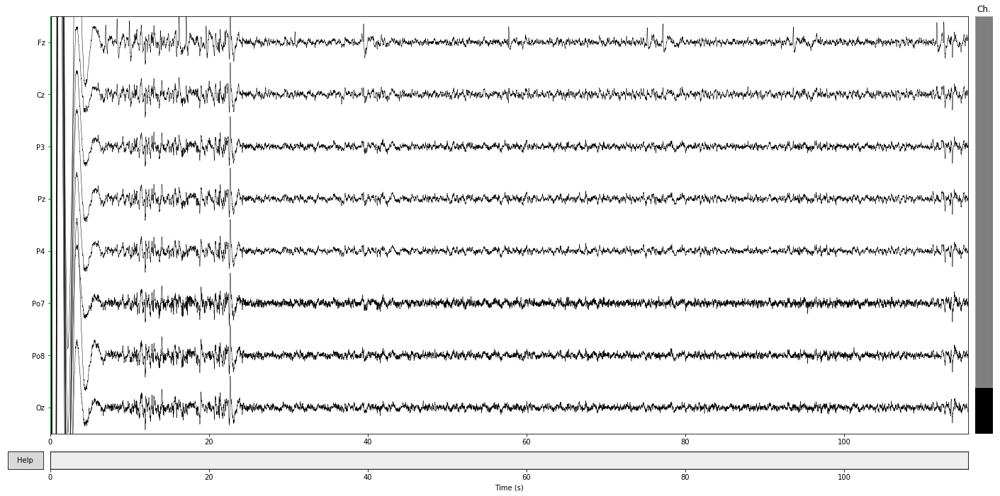

Setting up band-stop filter from 49 - 51 Hz
Filter length of 1651 samples (6.604 sec) selected
Setting up band-pass filter from 0.5 - 30 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 1651 samples (6.604 sec) selected
Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
Fitting ICA took 0.1s.
Transforming to ICA space (8 components)
Zeroing out 3 ICA components
Creating RawArray with float64 data, n_channels=9, n_times=28901
    Range : 0 ... 28900 =      0.000 ...   115.600 secs
Ready.


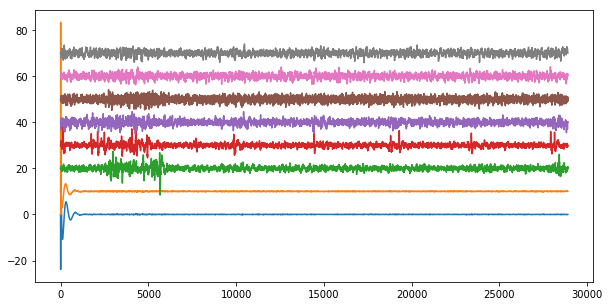

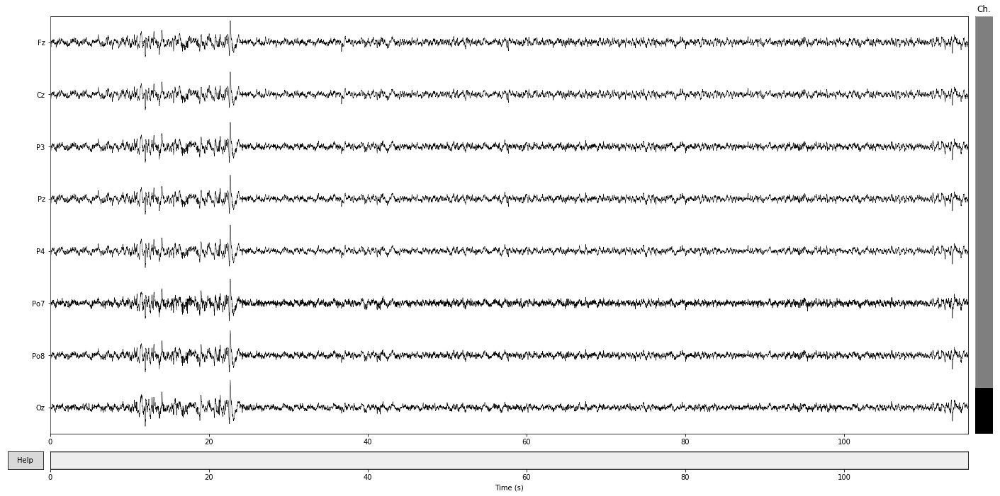

900 events found
Event IDs: [1 2]
900 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 900 events and 201 original time points ...
0 bad epochs dropped
time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-591-8cfcad17c42b>:2: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



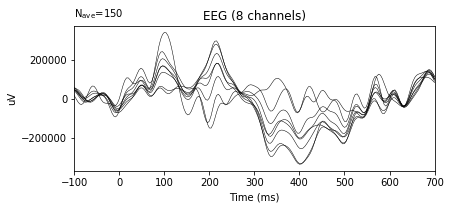

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning


<ipython-input-591-8cfcad17c42b>:5: DeprecationWarning:

time_unit defaults to "ms" in 0.16 but will change to "s" in 0.17, set it explicitly to avoid this warning



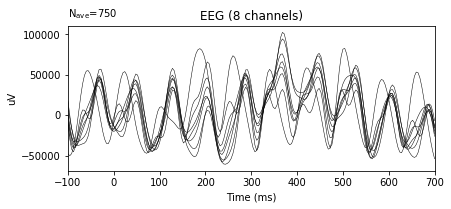

In [631]:
epochs = process_signal(8, features_extraction=False)

A local peak is defined as the most extreme point within the measurement window that is also larger than the average voltage over the N time points immediately before the peak and the average voltage over the N time points immediately after the peak.

If you look at the measurements file, you will see that it has gotten the local peak at around 200 ms rather than the rising shoulder of the next wave. In this example, a peak was defined as being larger than the 10 points (20 ms given a 500-Hz sampling rate) on either side of the peak. Trying changing this to 2 points and running it again. Now it captures the rising shoulder of the next peak. In a real experiment, you will need to try different values until you find something that is appropriate given the nature of the peaks and the noise level in your data.

In [578]:
scores = get_scores(epochs['2'], 7)

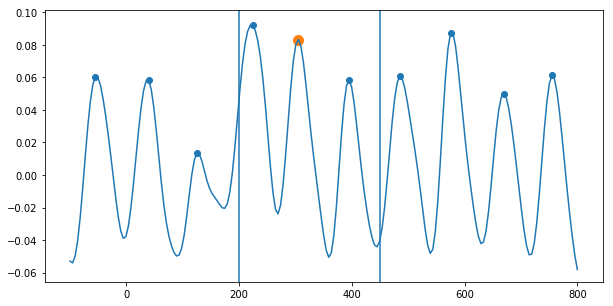

In [580]:
max_index  = detect_peak(scores, draw_peak=True)

In [577]:
extract_peak_features(scores, max_index)

(348.0, 0.334150720237832, 0.1894670040536871, 144.0, 48.0)

In [536]:
# channel_latencies = []

# for i in range(0, 8):
#     channel_latencies += [(l, i) for l in detect_peaks(epochs['1'], i)]

In [522]:
def find_erp_sequence(peaks, max_classes=8, expected_peak=300):
    lengths = {}
    peaks = list(sorted(peaks))
    for index, point in enumerate(peaks):
        classes = set([point[1]])
        distance = 0
        prev_point = point
        for next_point in peaks[index + 1:]:
            if next_point[1] not in classes:
                classes.add(next_point[1])
                distance += (next_point[0] - prev_point[0])
                prev_point = next_point
        
        if len(classes) == max_classes:
            lengths[point[0]] = distance # + np.abs(expected_peak - point[0])
    return lengths

In [523]:
# lengths = find_erp_sequence(channel_latencies)
# sorted(lengths.items(), key=lambda x: x[1])